# REDUCCIÓN DE DATOS ASTRONÓMICOS

First of all, we will import all the packages we need

In [1]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import glob
from matplotlib.ticker import ScalarFormatter
import lacosmic
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.utils import circular_footprint
import pandas as pd
import matplotlib.colors as colors
from photutils.detection import DAOStarFinder
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils.aperture import CircularAperture
from photutils.centroids import centroid_sources
from scipy.ndimage import rotate, zoom
from photutils.aperture import aperture_photometry
from astropy.convolution import Gaussian2DKernel, convolve
from astropy.modeling import models, fitting
from photutils.morphology import data_properties
import plotly.graph_objects as go

# Primeros pasos

We search for all *.fits files, and [sorts](`file:///home/angel/ProyectosAstronomia/IntroductionPython/IntroductionPython/_build/compounds_171221.html#3.5.1.-Basics-of-dicts) the list of paths in numerical order.

In [2]:
ls NGC6118/*.fits

NGC6118/r326214.fits  NGC6118/r326234.fits  NGC6118/r326291.fits
NGC6118/r326215.fits  NGC6118/r326245.fits  NGC6118/r326292.fits
NGC6118/r326216.fits  NGC6118/r326246.fits  NGC6118/r326293.fits
NGC6118/r326217.fits  NGC6118/r326247.fits  NGC6118/r326294.fits
NGC6118/r326218.fits  NGC6118/r326248.fits  NGC6118/r326295.fits
NGC6118/r326219.fits  NGC6118/r326249.fits  NGC6118/r326296.fits
NGC6118/r326220.fits  NGC6118/r326250.fits  NGC6118/r326297.fits
NGC6118/r326221.fits  NGC6118/r326251.fits  NGC6118/r326298.fits
NGC6118/r326222.fits  NGC6118/r326252.fits  NGC6118/r326299.fits
NGC6118/r326223.fits  NGC6118/r326285.fits  NGC6118/r326300.fits
NGC6118/r326229.fits  NGC6118/r326286.fits  NGC6118/r326301.fits
NGC6118/r326230.fits  NGC6118/r326287.fits  NGC6118/r326310.fits
NGC6118/r326231.fits  NGC6118/r326288.fits  NGC6118/r326311.fits
NGC6118/r326232.fits  NGC6118/r326289.fits  NGC6118/r326312.fits
NGC6118/r326233.fits  NGC6118/r326290.fits  NGC6118/r326313.fits


In [3]:
fileList=sorted(glob.glob('NGC6118/*.fits'))
fileList

['NGC6118/r326214.fits',
 'NGC6118/r326215.fits',
 'NGC6118/r326216.fits',
 'NGC6118/r326217.fits',
 'NGC6118/r326218.fits',
 'NGC6118/r326219.fits',
 'NGC6118/r326220.fits',
 'NGC6118/r326221.fits',
 'NGC6118/r326222.fits',
 'NGC6118/r326223.fits',
 'NGC6118/r326229.fits',
 'NGC6118/r326230.fits',
 'NGC6118/r326231.fits',
 'NGC6118/r326232.fits',
 'NGC6118/r326233.fits',
 'NGC6118/r326234.fits',
 'NGC6118/r326245.fits',
 'NGC6118/r326246.fits',
 'NGC6118/r326247.fits',
 'NGC6118/r326248.fits',
 'NGC6118/r326249.fits',
 'NGC6118/r326250.fits',
 'NGC6118/r326251.fits',
 'NGC6118/r326252.fits',
 'NGC6118/r326285.fits',
 'NGC6118/r326286.fits',
 'NGC6118/r326287.fits',
 'NGC6118/r326288.fits',
 'NGC6118/r326289.fits',
 'NGC6118/r326290.fits',
 'NGC6118/r326291.fits',
 'NGC6118/r326292.fits',
 'NGC6118/r326293.fits',
 'NGC6118/r326294.fits',
 'NGC6118/r326295.fits',
 'NGC6118/r326296.fits',
 'NGC6118/r326297.fits',
 'NGC6118/r326298.fits',
 'NGC6118/r326299.fits',
 'NGC6118/r326300.fits',


We do a small test to try to visualize one of the images. We will open a random image from the given ones using `fits.open`. In a FITS image, we have the image information in the header and, on the other hand, the data itself. That is why we call it HDUL (Header Data Unit List).

In [4]:
hdul = fits.open('NGC6118/r326313.fits')
hdul.info()
hdul.close()

Filename: NGC6118/r326313.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (2088, 2120)   int16 (rescales to uint16)   


Here we see the information of one of the files. Now, let's obtain a list of HDUL from this FITS file.

In [5]:
hdul = fits.open('NGC6118/r326245.fits')
imagen = hdul[0]

This "image" object is an HDUL that contains the header (where `[0]` refers to the first element within the HDUL list), with useful information about the image and the image data itself, as we mentioned earlier. Let's see what information the header provides us. To do this:

In [6]:
imagen.header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                   16 / Bits per pixel                                 
NAXIS   =                    2 / Number of axes                                 
NAXIS1  =                 2088 / Axis length                                    
NAXIS2  =                 2120 / Axis length                                    
EXTEND  =                    F / File may contain extensions                    
BSCALE  =           1.000000E0 / REAL = TAPE*BSCALE + BZERO                     
BZERO   =           3.276800E4 /                                                
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
DATE    = '2010-10-18T06:45:22' / Date FITS file was generated                  
IRAF-TLM= '2010-10-18T06:45:22' / Time of last modification                     
OBJECT  = 'cig0736r'           / Name of the object observed                    
RUN     =               3262

We can see all the information contained in the header. Now, let's do something similar to see what the data part contains.

In [7]:
imagen.data[30:40, 20:30]

array([[536, 537, 544, 547, 541, 544, 541, 543, 540, 542],
       [537, 536, 547, 544, 542, 544, 542, 543, 543, 542],
       [536, 534, 543, 548, 543, 547, 544, 545, 541, 545],
       [537, 537, 541, 548, 543, 545, 541, 540, 540, 547],
       [536, 539, 543, 549, 542, 539, 544, 545, 546, 540],
       [536, 537, 549, 540, 539, 539, 544, 541, 544, 547],
       [537, 537, 545, 540, 545, 546, 548, 544, 544, 545],
       [538, 534, 542, 542, 545, 546, 543, 542, 543, 543],
       [535, 538, 549, 546, 540, 542, 545, 543, 539, 544],
       [539, 534, 549, 543, 544, 545, 548, 545, 546, 542]], dtype=uint16)

We see that it is an array-type object that contains, for each pixel of the CCD, a value proportional to the intensity of light it receives. Let's plot it.

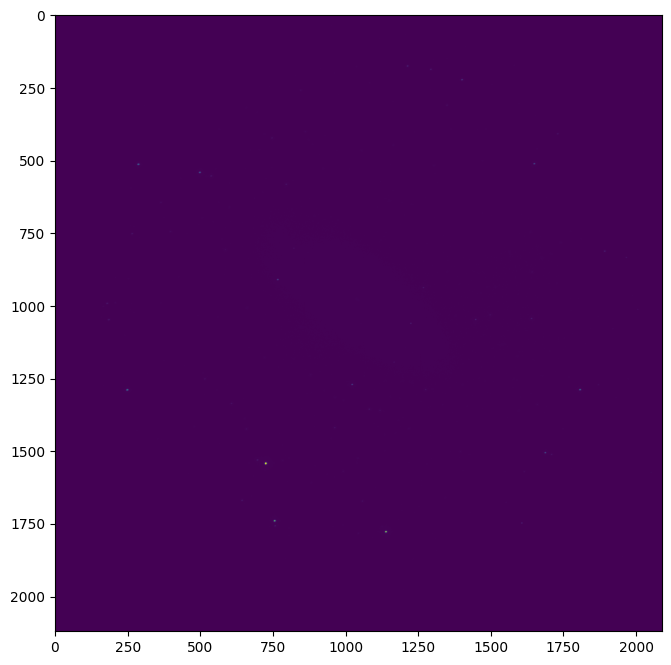

In [8]:
plt.figure(figsize=(8,8))
plt.imshow(imagen.data)
plt.show()

We can't see anything, let's fix it

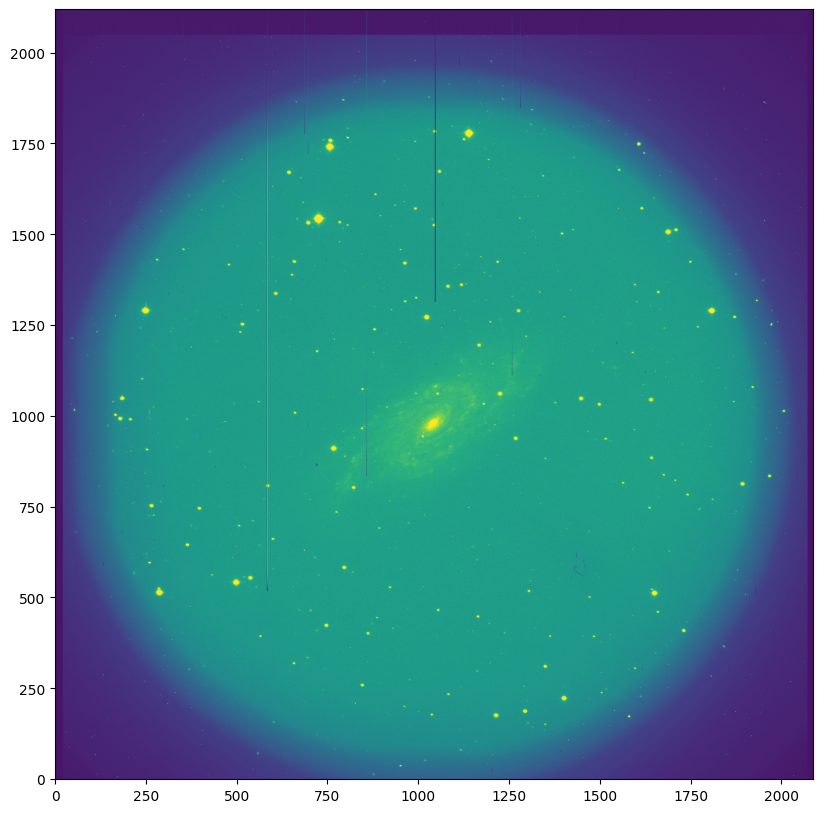

In [9]:
plt.figure('First test', figsize = (10, 10))
plt.imshow(imagen.data, vmin = np.min(imagen.data), vmax = np.mean(imagen.data) + np.std(imagen.data), origin = 'lower')
plt.show()

## fileName

On the other hand, we can also select specific information from the header that we want to extract from the file in the following way:

In [10]:
fits.open('NGC6118/r326313.fits')[0].header['OBJECT']

'FlatAmaHa6607'

Let's extract the file names, the object, and the exposure time (exptime) from all the files we have.

In [11]:
for fileName in fileList:
    print(fileName[-12:], fits.open(fileName)[0].header['OBJECT'], fits.open(fileName)[0].header['EXPTIME'])

r326214.fits Bias 0.0
r326215.fits Bias 0.0
r326216.fits Bias 0.0
r326217.fits Bias 0.0
r326218.fits Bias 0.0
r326219.fits FlatHa6607 3.01
r326220.fits FlatHa6607 3.01
r326221.fits FlatHa6607 3.01
r326222.fits FlatHa6607 6.01
r326223.fits FlatHa6607 10.01
r326229.fits FlatrS 5.01
r326230.fits FlatrS 10.01
r326231.fits FlatrS 25.01
r326232.fits FlatrS 60.01
r326233.fits FlatrS 90.01
r326234.fits FlatrS 120.01
r326245.fits cig0736r 300.01
r326246.fits cig0736r 300.01
r326247.fits cig0736r 300.01
r326248.fits cig0736r 300.01
r326249.fits cig0736Ha6607 1200.01
r326250.fits cig0736Ha6607 1200.01
r326251.fits cig0736Ha6607 1200.01
r326252.fits cig0736Ha6607 1200.01
r326285.fits Bias 0.0
r326286.fits Bias 0.0
r326287.fits Bias 0.0
r326288.fits Bias 0.0
r326289.fits Bias 0.0
r326290.fits Bias 0.0
r326291.fits Bias 0.0
r326292.fits Bias 0.0
r326293.fits Bias 0.0
r326294.fits Bias 0.0
r326295.fits FlatAmarS 120.01
r326296.fits FlatAmarS 120.01
r326297.fits FlatAmarS 120.01
r326298.fits FlatAmarS

## Bias, Flat & Cig Lists

Now, let's create a list for each type of file we have, classified into bias, flats, and cig. First, we will do it in a basic way, then we will level up using a list comprehension.

In [12]:
biasList = []
flatList = []
cigList = []

for fileName in fileList:
    objeto = fits.open(fileName)[0].header['OBJECT']
    
    if "Bias" in objeto:
        biasList.append(fileName)
    elif "Flat" in objeto or "Falt" in objeto:
        flatList.append(fileName)
    elif "cig" in objeto:
        cigList.append(fileName)

print(biasList)
print(flatList)
print(cigList)

['NGC6118/r326214.fits', 'NGC6118/r326215.fits', 'NGC6118/r326216.fits', 'NGC6118/r326217.fits', 'NGC6118/r326218.fits', 'NGC6118/r326285.fits', 'NGC6118/r326286.fits', 'NGC6118/r326287.fits', 'NGC6118/r326288.fits', 'NGC6118/r326289.fits', 'NGC6118/r326290.fits', 'NGC6118/r326291.fits', 'NGC6118/r326292.fits', 'NGC6118/r326293.fits', 'NGC6118/r326294.fits']
['NGC6118/r326219.fits', 'NGC6118/r326220.fits', 'NGC6118/r326221.fits', 'NGC6118/r326222.fits', 'NGC6118/r326223.fits', 'NGC6118/r326229.fits', 'NGC6118/r326230.fits', 'NGC6118/r326231.fits', 'NGC6118/r326232.fits', 'NGC6118/r326233.fits', 'NGC6118/r326234.fits', 'NGC6118/r326295.fits', 'NGC6118/r326296.fits', 'NGC6118/r326297.fits', 'NGC6118/r326298.fits', 'NGC6118/r326299.fits', 'NGC6118/r326300.fits', 'NGC6118/r326301.fits', 'NGC6118/r326310.fits', 'NGC6118/r326311.fits', 'NGC6118/r326312.fits', 'NGC6118/r326313.fits']
['NGC6118/r326245.fits', 'NGC6118/r326246.fits', 'NGC6118/r326247.fits', 'NGC6118/r326248.fits', 'NGC6118/r326

We check that it came out correctly.

In [13]:
for fileName in biasList:
    print(fileName[-12:], fits.open(fileName)[0].header['OBJECT'])

r326214.fits Bias
r326215.fits Bias
r326216.fits Bias
r326217.fits Bias
r326218.fits Bias
r326285.fits Bias
r326286.fits Bias
r326287.fits Bias
r326288.fits Bias
r326289.fits Bias
r326290.fits Bias
r326291.fits Bias
r326292.fits Bias
r326293.fits Bias
r326294.fits Bias


In [14]:
for fileName in flatList:
    print(fileName[-12:], fits.open(fileName)[0].header['OBJECT'])

r326219.fits FlatHa6607
r326220.fits FlatHa6607
r326221.fits FlatHa6607
r326222.fits FlatHa6607
r326223.fits FlatHa6607
r326229.fits FlatrS
r326230.fits FlatrS
r326231.fits FlatrS
r326232.fits FlatrS
r326233.fits FlatrS
r326234.fits FlatrS
r326295.fits FlatAmarS
r326296.fits FlatAmarS
r326297.fits FlatAmarS
r326298.fits FlatAmarS
r326299.fits FlatAmarS
r326300.fits FlatAmarS
r326301.fits FlatAmarS
r326310.fits FaltAmaHa6607
r326311.fits FaltAmaHa6607
r326312.fits FlatAmaHa6607
r326313.fits FlatAmaHa6607


In [15]:
for fileName in cigList:
    print(fileName[-12:], fits.open(fileName)[0].header['OBJECT'])

r326245.fits cig0736r
r326246.fits cig0736r
r326247.fits cig0736r
r326248.fits cig0736r
r326249.fits cig0736Ha6607
r326250.fits cig0736Ha6607
r326251.fits cig0736Ha6607
r326252.fits cig0736Ha6607


Like list comprehension:

In [16]:
biasList = [fileName for fileName in fileList if "Bias" in fits.open(fileName)[0].header['OBJECT']]
flatList = [fileName for fileName in fileList if "Flat" in fits.open(fileName)[0].header['OBJECT'] or "Falt" in fits.open(fileName)[0].header['OBJECT']]
cigList  = [fileName for fileName in fileList if "cig" in fits.open(fileName)[0].header['OBJECT']]

## Statistics

Okay, we now have our lists, and we will use them later. Now, let's extract statistics from our data, such as the mean and median. First, we will start in a basic way, and then we will define a function that performs all these calculations more easily, using [numpy](file:///home/angel/ProyectosAstronomia/IntroductionPython/IntroductionPython/_build/numpy_171219.html#6.-NumPy).

In [17]:
for fileName in fileList:
    data = fits.open(fileName)[0].data
    media = np.mean(data)
    mediana = np.median(data)
    minimo = np.min(data)
    maximo = np.max(data)
    desviacion_estandar = np.std(data)
    num_pixeles = data.size


    print(f"{fileName[-12:]}:Media={media},Mediana={mediana},Desv_Est={desviacion_estandar},Min={minimo},Max={maximo},Total_Pix={num_pixeles}")

r326214.fits:Media=541.0289572489698,Mediana=541.0,Desv_Est=5.29484102604657,Min=514,Max=3862,Total_Pix=4426560
r326215.fits:Media=541.2434147509579,Mediana=541.0,Desv_Est=31.207988159418907,Min=514,Max=65535,Total_Pix=4426560
r326216.fits:Media=541.2656701818116,Mediana=541.0,Desv_Est=31.36689770933954,Min=508,Max=65535,Total_Pix=4426560
r326217.fits:Media=541.2682606809802,Mediana=541.0,Desv_Est=31.14453058554209,Min=509,Max=65535,Total_Pix=4426560
r326218.fits:Media=542.2854098893949,Mediana=542.0,Desv_Est=31.14583383548535,Min=514,Max=65535,Total_Pix=4426560
r326219.fits:Media=9749.932615620255,Mediana=11377.0,Desv_Est=3928.619199883995,Min=518,Max=23075,Total_Pix=4426560
r326220.fits:Media=7858.465789913613,Mediana=9153.0,Desv_Est=3122.0328752685396,Min=519,Max=18443,Total_Pix=4426560
r326221.fits:Media=6388.975139611798,Mediana=7424.0,Desv_Est=2496.104595164152,Min=517,Max=14660,Total_Pix=4426560
r326222.fits:Media=8448.815028374178,Mediana=9849.0,Desv_Est=3372.4260919515377,Min=

In [18]:
def imstats(data):
    """
    Computes statistics for a FITS image.

    Parameters:
    data : numpy.array
        Data matrix of the FITS image.

    Returns:
    dict
        Dictionary containing the mean, median, standard deviation,
        minimum, and maximum of the image.

    Usage:
    stats = imstats(data)
    print(stats["mean"])  # Displays the mean of the image
    """
    
    stats = {
        "mean": np.mean(data),
        "median": np.median(data),
        "std": np.std(data),
        "min": np.min(data),
        "max": np.max(data),
        "size": data.size
    }

    return stats

In [19]:
for fileName in fileList:
    data = fits.open(fileName)[0].data
    stats = imstats(data)
    #print(stats)
    print(f"{fileName[-12:]}: mean = {stats["mean"]}, median = {stats["median"]}, std = {stats["std"]}, min = {stats["min"]}, max = {stats["max"]}, Size = {stats["size"]}")

r326214.fits: mean = 541.0289572489698, median = 541.0, std = 5.29484102604657, min = 514, max = 3862, Size = 4426560
r326215.fits: mean = 541.2434147509579, median = 541.0, std = 31.207988159418907, min = 514, max = 65535, Size = 4426560
r326216.fits: mean = 541.2656701818116, median = 541.0, std = 31.36689770933954, min = 508, max = 65535, Size = 4426560
r326217.fits: mean = 541.2682606809802, median = 541.0, std = 31.14453058554209, min = 509, max = 65535, Size = 4426560
r326218.fits: mean = 542.2854098893949, median = 542.0, std = 31.14583383548535, min = 514, max = 65535, Size = 4426560
r326219.fits: mean = 9749.932615620255, median = 11377.0, std = 3928.619199883995, min = 518, max = 23075, Size = 4426560
r326220.fits: mean = 7858.465789913613, median = 9153.0, std = 3122.0328752685396, min = 519, max = 18443, Size = 4426560
r326221.fits: mean = 6388.975139611798, median = 7424.0, std = 2496.104595164152, min = 517, max = 14660, Size = 4426560
r326222.fits: mean = 8448.8150283741

We see that the function we defined works the same as all the code we wrote earlier. Additionally, we have added a docstring to indicate what type of object it reads and what type of object it returns. Once all this is done, we are ready to calculate the superbias and superflats.

# SuperBias

**Bias** are "images" taken with the optical system covered and with 0 seconds of exposure time. They are used to account for the counts that the CCD registers without any photons actually hitting it. This is very important for properly calibrating the images.  

The goal is to create a **superBias** that contains, in each pixel, an average of these bias counts. Then, we can subtract it from our images.  

We have already created a function that returns a dictionary with the most relevant statistical data of an image. Let's apply it only to the bias list and analyze the results.

In [20]:
for fileName in biasList:
    data = fits.open(fileName)[0].data
    stats = imstats(data)
    #print(stats)
    print(f"{fileName[-12:]}: mean = {stats["mean"]}, median = {stats["median"]}, std = {stats["std"]}, min = {stats["min"]}, max = {stats["max"]}, Size = {stats["size"]}")

r326214.fits: mean = 541.0289572489698, median = 541.0, std = 5.29484102604657, min = 514, max = 3862, Size = 4426560
r326215.fits: mean = 541.2434147509579, median = 541.0, std = 31.207988159418907, min = 514, max = 65535, Size = 4426560
r326216.fits: mean = 541.2656701818116, median = 541.0, std = 31.36689770933954, min = 508, max = 65535, Size = 4426560
r326217.fits: mean = 541.2682606809802, median = 541.0, std = 31.14453058554209, min = 509, max = 65535, Size = 4426560
r326218.fits: mean = 542.2854098893949, median = 542.0, std = 31.14583383548535, min = 514, max = 65535, Size = 4426560
r326285.fits: mean = 538.2795091447987, median = 538.0, std = 3.837124591351188, min = 508, max = 2414, Size = 4426560
r326286.fits: mean = 538.1924121665583, median = 538.0, std = 31.1474701594421, min = 511, max = 65535, Size = 4426560
r326287.fits: mean = 538.2404770295669, median = 538.0, std = 31.082269903312774, min = 509, max = 65535, Size = 4426560
r326288.fits: mean = 538.336814817827, med

The first and sixth bias have anomalous standard deviation and maximum values, so we are going to remove them.

In [21]:
path = 'NGC6118/'

In [22]:
print(biasList)

['NGC6118/r326214.fits', 'NGC6118/r326215.fits', 'NGC6118/r326216.fits', 'NGC6118/r326217.fits', 'NGC6118/r326218.fits', 'NGC6118/r326285.fits', 'NGC6118/r326286.fits', 'NGC6118/r326287.fits', 'NGC6118/r326288.fits', 'NGC6118/r326289.fits', 'NGC6118/r326290.fits', 'NGC6118/r326291.fits', 'NGC6118/r326292.fits', 'NGC6118/r326293.fits', 'NGC6118/r326294.fits']


In [23]:
for badBias in [path + "r326214.fits", path + "r326285.fits"]:
    biasList.remove(badBias)

print(biasList)

['NGC6118/r326215.fits', 'NGC6118/r326216.fits', 'NGC6118/r326217.fits', 'NGC6118/r326218.fits', 'NGC6118/r326286.fits', 'NGC6118/r326287.fits', 'NGC6118/r326288.fits', 'NGC6118/r326289.fits', 'NGC6118/r326290.fits', 'NGC6118/r326291.fits', 'NGC6118/r326292.fits', 'NGC6118/r326293.fits', 'NGC6118/r326294.fits']


Once the "bad" bias frames are discarded, the goal of having so many bias frames is to combine them so we can subtract them from our astrophysical images. We would have 13 layers of bias, each containing a number of pixels, forming what we call the **superBias**. This combination will be statistically much more robust.  

The way to combine them is by taking the median pixel by pixel so that extreme values, caused by cosmic rays, for example, are discarded.

In [24]:
bias_concat = [fits.open(bias)[0].data for bias in biasList]
superBias = np.median(bias_concat, axis=0)

Let's see how the superBias turned out.

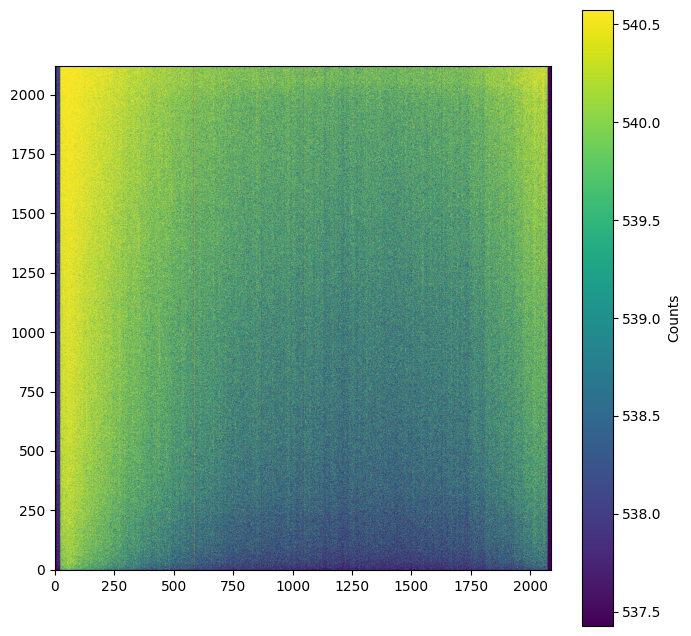

In [25]:
plt.figure("Super bias", figsize=(8,8))
plt.imshow(superBias, vmin=stats['median'] - 0.05 * stats['std'], vmax=stats['median'] + 0.05 * stats['std'], origin="lower", cmap="viridis")
plt.colorbar(label="Counts")
plt.savefig("superBias.png")
plt.show()

# SuperFlat

**Flats** are images of the sky taken at dawn or dusk.  

This is done because, at these times, the sky is a very homogeneous light source, but not too bright to saturate the detectors.  

As we did before, we are going to create a list with all the flats, which we already have and is called `flatLists`.  

In fact, we are going to create two lists:  
- One with the flats taken with the **R filter**.  
- Another with the flats taken with the **Hα filter**.

In [26]:
listFlatR = [fileName for fileName in flatList
              if "FlatrS" in fits.open(fileName)[0].header['OBJECT'] or "FlatAmarS" in fits.open(fileName)[0].header['OBJECT']]
listFlatR

['NGC6118/r326229.fits',
 'NGC6118/r326230.fits',
 'NGC6118/r326231.fits',
 'NGC6118/r326232.fits',
 'NGC6118/r326233.fits',
 'NGC6118/r326234.fits',
 'NGC6118/r326295.fits',
 'NGC6118/r326296.fits',
 'NGC6118/r326297.fits',
 'NGC6118/r326298.fits',
 'NGC6118/r326299.fits',
 'NGC6118/r326300.fits',
 'NGC6118/r326301.fits']

In [27]:
listFlatHa = [fileName for fileName in flatList
              if "FlatHa6607" in fits.open(fileName)[0].header['OBJECT'] or "FlatAmaHa6607" in fits.open(fileName)[0].header['OBJECT'] or "FaltAmaHa6607" in fits.open(fileName)[0].header['OBJECT']]
listFlatHa

['NGC6118/r326219.fits',
 'NGC6118/r326220.fits',
 'NGC6118/r326221.fits',
 'NGC6118/r326222.fits',
 'NGC6118/r326223.fits',
 'NGC6118/r326310.fits',
 'NGC6118/r326311.fits',
 'NGC6118/r326312.fits',
 'NGC6118/r326313.fits']

Once they are created, we are going to subtract the **superBias**.

In [28]:
flatR_concat = [(fits.open(flatR)[0].data - superBias) for flatR in listFlatR]
flatHa_concat = [(fits.open(flatHa)[0].data - superBias) for flatHa in listFlatHa]

We select the central area since we have black margins because the filter blocks the light.

In [29]:
cutR = [flat[500:-500, 500:-500] for flat in flatR_concat]
cutHa = [flat[500:-500, 500:-500] for flat in flatHa_concat]

We normalize this central area by the median.

In [30]:
for i in range(len(flatR_concat)):
    flatR_concat[i] = flatR_concat[i] / np.nanmedian(cutR[i])
for i in range(len(flatHa_concat)):
    flatHa_concat[i] = flatHa_concat[i] / np.nanmedian(cutHa[i])

Okay, now that it is normalized, we are going to combine them to create the **superFlat** for each band.  We do this by taking the median of each pixel across the list of flats (for each filter).

In [31]:
superFlatR = np.nanmedian(flatR_concat, axis=0)
superFlatHa = np.nanmedian(flatHa_concat, axis=0)

Now, we just need to plot. To do this, I am going to create a function.

In [32]:
def plot_flat(image, title):
    """
    Generates and displays a normalized flat image with its color scale.

    Parameters:
    image : numpy.ndarray
        2D matrix representing the normalized flat image.
    title : str
        Title of the figure to be displayed.

    Description:
    - Visualizes the image using `imshow()` with a 'viridis' color scale.
    - Adjusts the value range (`vmin`, `vmax`) using the median 
      and standard deviation of the image.
    - Adds a color bar labeled "Normalized values."
    - Displays the figure with the provided title.

    Usage example:
    >>> plot_flat(superFlatR, "SuperFlat R")
    >>> plot_flat(superFlatHa, "SuperFlat Hα")
    """
    stats = imstats(image)
    plt.figure(title, figsize=(8, 8))
    plt.imshow(image, vmin=stats["median"] - 0.3 * stats["std"],
                      vmax=stats["median"] + 0.3 * stats["std"], 
                      origin="lower", cmap="viridis")
    plt.colorbar(label="Normalized values")
    plt.title(title)
    plt.show()

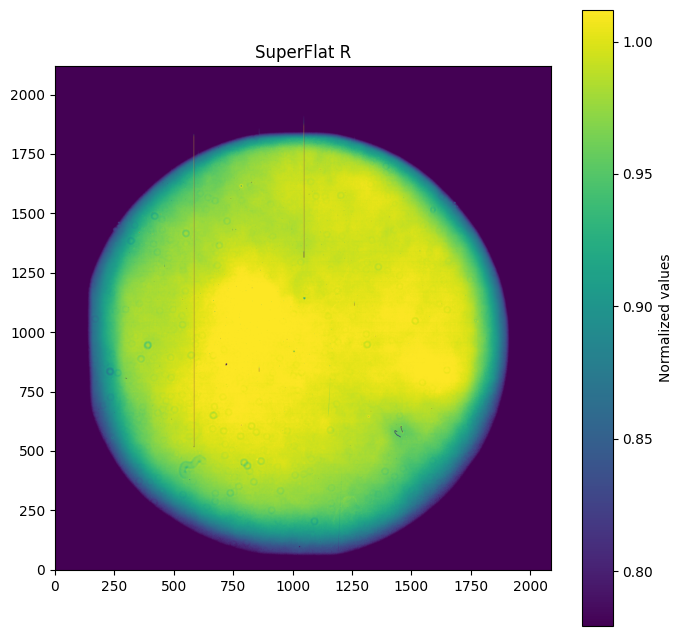

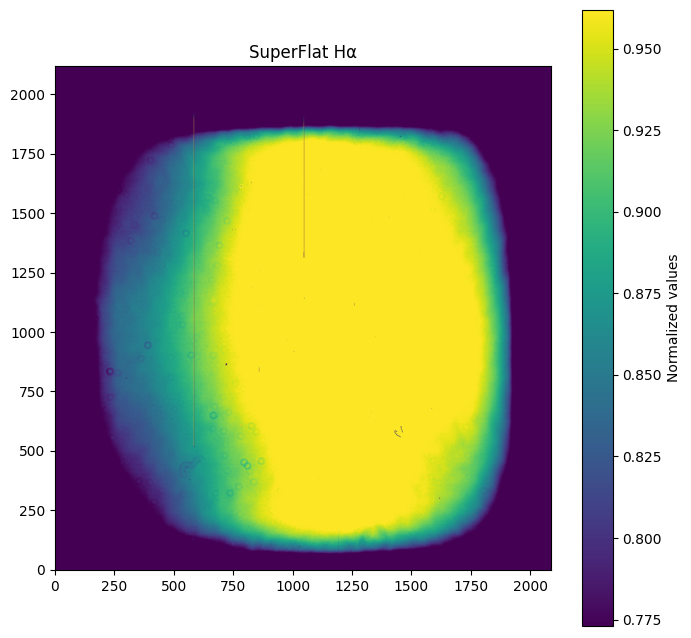

In [33]:
plot_flat(superFlatR, "SuperFlat R")
plot_flat(superFlatHa, "SuperFlat Hα")

## Saving images

In [34]:
hdu = fits.PrimaryHDU(superBias)
hdu.writeto('superBias.fits', overwrite=True)

In [35]:
hdu = fits.PrimaryHDU(superFlatR)
hdu.writeto('superFlatR.fits', overwrite=True)

In [36]:
hdu = fits.PrimaryHDU(superFlatHa)
hdu.writeto('superFlatHa.fits', overwrite=True)

# Cosmic Rays

When working with astronomical images, we often encounter artifacts known as cosmic rays. These are high-energy particles from space that randomly hit the CCD detector, producing bright, irregularly shaped spots or 'stains' in our images. These artifacts can interfere with our analysis, so it is important to identify and remove them.

Cosmic rays can be distinguished from actual celestial objects, such as galaxies and stars, by analyzing the pixel values and the shape of the artifacts. While galaxies and stars generally have smooth, continuous profiles with gradually varying pixel intensities, cosmic ray hits typically appear as isolated pixels or clusters of a few pixels with very high intensity values. Their shapes tend to be sharp, spiky, and often irregular compared to the more diffuse appearance of astronomical objects.

To remove these cosmic ray artifacts in Jupyter Lab, we can use the [lacosmic](https://lacosmic.readthedocs.io/en/stable/api/lacosmic.lacosmic.html#lacosmic.lacosmic) package. This is a well-established tool for detecting and cleaning cosmic rays from CCD images. It applies an algorithm that identifies cosmic rays based on their characteristic pixel intensity patterns and shapes, replacing the affected pixels with interpolated values from surrounding areas.

## Galaxies lists

In order to clean our galaxies' images, first of all, we're going to make two list for each filter:

In [37]:
galaxyHa = [f for f in fileList if fits.open(f)[0].header['Object'] == 'cig0736Ha6607']
galaxyR = [f for f in fileList if fits.open(f)[0].header['Object'] == 'cig0736r']

In [38]:
print(galaxyHa)
print(galaxyR)

['NGC6118/r326249.fits', 'NGC6118/r326250.fits', 'NGC6118/r326251.fits', 'NGC6118/r326252.fits']
['NGC6118/r326245.fits', 'NGC6118/r326246.fits', 'NGC6118/r326247.fits', 'NGC6118/r326248.fits']


## Using lacosmic

Now, we can run lacosmic for each list:

In [39]:
cleanR = []
masksR = []
for R in galaxyR:
    data = fits.open(R)[0].data
    cleanImage, mask = lacosmic.lacosmic(data.astype(np.float32), contrast=2, cr_threshold=20,
                                         neighbor_threshold=10, effective_gain=10,readnoise=0)
    cleanR.append(cleanImage)
    masksR.append(mask)

INFO: Iteration 1: Found 793 cosmic-ray pixels, Total: 793 [lacosmic.core]
INFO: Iteration 2: Found 73 cosmic-ray pixels, Total: 866 [lacosmic.core]
INFO: Iteration 3: Found 31 cosmic-ray pixels, Total: 897 [lacosmic.core]
INFO: Iteration 4: Found 29 cosmic-ray pixels, Total: 926 [lacosmic.core]
INFO: Iteration 1: Found 809 cosmic-ray pixels, Total: 809 [lacosmic.core]
INFO: Iteration 2: Found 56 cosmic-ray pixels, Total: 865 [lacosmic.core]
INFO: Iteration 3: Found 27 cosmic-ray pixels, Total: 892 [lacosmic.core]
INFO: Iteration 4: Found 18 cosmic-ray pixels, Total: 910 [lacosmic.core]
INFO: Iteration 1: Found 749 cosmic-ray pixels, Total: 749 [lacosmic.core]
INFO: Iteration 2: Found 40 cosmic-ray pixels, Total: 789 [lacosmic.core]
INFO: Iteration 3: Found 6 cosmic-ray pixels, Total: 795 [lacosmic.core]
INFO: Iteration 4: Found 6 cosmic-ray pixels, Total: 801 [lacosmic.core]
INFO: Iteration 1: Found 722 cosmic-ray pixels, Total: 722 [lacosmic.core]
INFO: Iteration 2: Found 30 cosmic-r

In [40]:
cleanHa = []
masksHa = []
for Ha in galaxyHa:
    data = fits.open(Ha)[0].data
    cleanImage, mask = lacosmic.lacosmic(data.astype(np.float32), contrast=2, cr_threshold=20,
                                         neighbor_threshold=10, effective_gain=10, readnoise=0)
    cleanHa.append(cleanImage)
    masksHa.append(mask)

INFO: Iteration 1: Found 2554 cosmic-ray pixels, Total: 2554 [lacosmic.core]
INFO: Iteration 2: Found 146 cosmic-ray pixels, Total: 2700 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2704 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2704 [lacosmic.core]
INFO: Iteration 1: Found 2659 cosmic-ray pixels, Total: 2659 [lacosmic.core]
INFO: Iteration 2: Found 110 cosmic-ray pixels, Total: 2769 [lacosmic.core]
INFO: Iteration 3: Found 4 cosmic-ray pixels, Total: 2773 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2773 [lacosmic.core]
INFO: Iteration 1: Found 2753 cosmic-ray pixels, Total: 2753 [lacosmic.core]
INFO: Iteration 2: Found 118 cosmic-ray pixels, Total: 2871 [lacosmic.core]
INFO: Iteration 3: Found 3 cosmic-ray pixels, Total: 2874 [lacosmic.core]
INFO: Iteration 4: Found 0 cosmic-ray pixels, Total: 2874 [lacosmic.core]
INFO: Iteration 1: Found 2556 cosmic-ray pixels, Total: 2556 [lacosmic.core]
INFO: Iteration 2: F

Let's save our images:

In [41]:
for i, cleanImage in enumerate(cleanHa):
    hdu = fits.PrimaryHDU(cleanImage.astype(np.float32))
    hdu.writeto(f'galaxyHaClean{i}.fits', overwrite=True)

In [42]:
for i, cleanImage in enumerate(cleanR):
    hdu = fits.PrimaryHDU(cleanImage.astype(np.float32))
    hdu.writeto(f'galaxyRClean{i}.fits', overwrite=True)

In [43]:
for i, mask in enumerate(masksR):
    hdu = fits.PrimaryHDU(mask.astype(np.float32))
    hdu.writeto(f'cosmicRayMaskR{i}.fits', overwrite=True)

In [44]:
for i, mask in enumerate(masksHa):
    hdu = fits.PrimaryHDU(mask.astype(np.float32))
    hdu.writeto(f'cosmicRayMaskHa{i}.fits', overwrite=True)

# SUBSTRACTION OF THE SUPERBIAS AND DIVISION BY THE SUPERFLAT

In this step, we're going to substract the superBias and divide by our superFlat for each filter Ha & R. The first step is doing a list of the previous saved images:

In [45]:
N = 4
cleanHaImages = [fits.open(f'galaxyHaClean{i}.fits')[0].data for i in range(N)]
cleanRImages = [fits.open(f'galaxyRClean{i}.fits')[0].data for i in range(N)]
masksR = [fits.open(f'cosmicRayMaskR{i}.fits')[0].data for i in range(N)]
masksHa = [fits.open(f'cosmicRayMaskHa{i}.fits')[0].data for i in range(N)]

Now we are ready to substract the superBias and divide by the superflats:

In [46]:
HaImages_bf = [(image - superBias) / superFlatHa for image in cleanHaImages]
RImages_bf = [(image - superBias) / superFlatR for image in cleanRImages]

/tmp/ipykernel_7947/1208274557.py:1: RuntimeWarning: divide by zero encountered in divide
  HaImages_bf = [(image - superBias) / superFlatHa for image in cleanHaImages]
/tmp/ipykernel_7947/1208274557.py:1: RuntimeWarning: invalid value encountered in divide
  HaImages_bf = [(image - superBias) / superFlatHa for image in cleanHaImages]
/tmp/ipykernel_7947/1208274557.py:2: RuntimeWarning: divide by zero encountered in divide
  RImages_bf = [(image - superBias) / superFlatR for image in cleanRImages]
/tmp/ipykernel_7947/1208274557.py:2: RuntimeWarning: invalid value encountered in divide
  RImages_bf = [(image - superBias) / superFlatR for image in cleanRImages]


# BACKGROUND SUBSTRACTION

When inspecting our images, we often detect unwanted background counts where there should be no signal. This luminous contamination can come from the Moon, nearby cities, or other light sources. Subtracting the background is crucial to ensure accurate photometric measurements.

Our objetive is to **estimate the background level** of the image and **subtract it**. Since sources of light (stars, galaxies) bias this estimation, we **mask** them first.

In order to do this:
1. **Detect sources**:
   - Estimate a **threshold** above which we identify bright objects.
   - Detect sources above this threshold.
   - Create a **mask** with circular footprints over the detected sources.

2. Estimate background statistics with **sigma clipping**:
   - Sigma clipping removes pixels that are more than 3σ away from the mean to exclude outliers.
   - We calculate mean, median, and standard deviation of the background **with and without the mask** for comparison.

Is important to understand the next key points:
- **Masking the sources** prevents bright objects from biasing the background estimation.
- **Sigma clipping** ensures that outliers (e.g., cosmic rays) do not affect the statistics.
- **NaNs or infs are automatically clipped**, as shown in the warning.


Our final goal is to use the mean or median background value to **subtract the background** from the image, improving the quality of the data.

**Reference**: [Photutils Background Masking Guide](https://photutils.readthedocs.io/en/stable/user_guide/background.html#masking-sources)

In [47]:
data = HaImages_bf[0]
sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
threshold = detect_threshold(data, nsigma=2.0, sigma_clip=sigma_clip)
segment_img = detect_sources(data, threshold, npixels=10)
footprint = circular_footprint(radius=10)
mask = segment_img.make_source_mask(footprint=footprint)
mean, median, std = sigma_clipped_stats(data, sigma=3.0, mask=mask)
print((mean, median, std))
mean, median, std = sigma_clipped_stats(data, sigma=3.0, mask=None)
print((mean, median, std))

(np.float64(17.492572751902006), np.float64(17.46508379888268), np.float64(4.021626181110528))


(np.float64(17.64833604853956), np.float64(17.616297771310407), np.float64(5.5343511018393645))


## Visualizing Mask

To ensure that the detected sources have been properly masked, we can visualize the mask. The mask is a binary image where:

    Pixels with value 1 are masked (sources detected).
    Pixels with value 0 are unmasked (background).

Visualizing this mask allows us to confirm that the bright sources have been covered, and that we are correctly isolating the background for our statistical estimation.

We can plot the mask as follows:

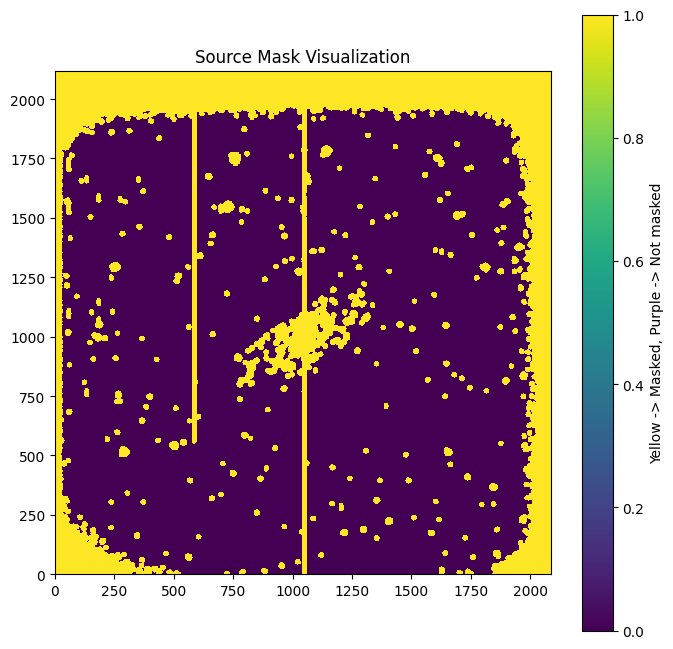

In [48]:
plt.figure('Source Mask', figsize=(8, 8))
plt.imshow(mask, origin='lower', interpolation='nearest')
plt.colorbar(label='Yellow -> Masked, Purple -> Not masked')
plt.title('Source Mask Visualization')
plt.show()

## Background Substraction

Once we have the mask, we can subtract it from our image. This allows us to correct for the luminous contamination and work with a cleaner image. The result will be a background-subtracted image, where the sky level is closer to zero. We can plot it to visually check that the background has been effectively removed as follows:

/home/angel/ProyectosAstronomia/envAstro1/lib/python3.12/site-packages/numpy/_core/_methods.py:135: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/home/angel/ProyectosAstronomia/envAstro1/lib/python3.12/site-packages/numpy/_core/_methods.py:171: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


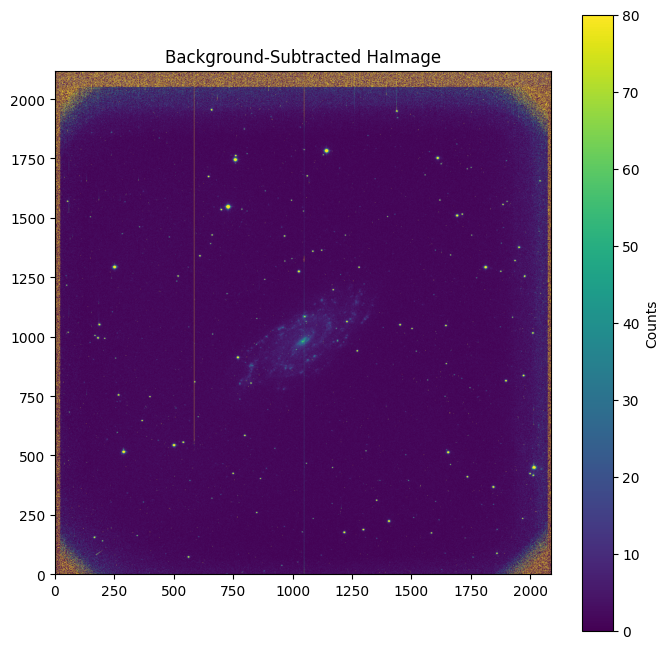

In [49]:
data_f = data - median
plt.figure('Background substraction Ha', figsize=(8,8))
stats = imstats(data_f)
plt.imshow(data_f, vmin=0, vmax=80, origin='lower')
plt.colorbar(label='Counts')
plt.title('Background-Subtracted HaImage')
plt.show()

We can do as example, how looks our galaxy before doing this treatment, let's see:

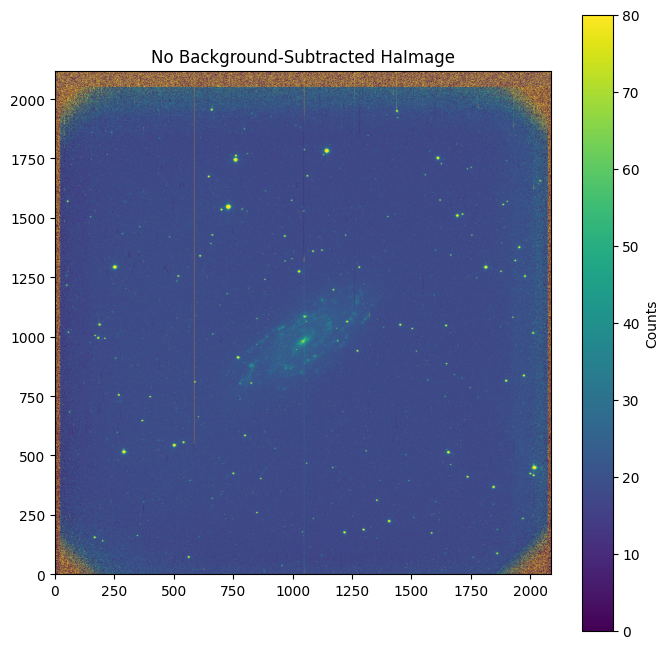

In [50]:
plt.figure('Galaxy before background substraction Ha', figsize=(8, 8))
plt.imshow(HaImages_bf[1], vmin=0, vmax=80, origin='lower')
plt.colorbar(label='Counts')
plt.title('No Background-Subtracted HaImage')
plt.show()

Before subtracting the background, the image appears worse and less uniform. There is a visible gradient and residual light contamination across the frame, likely from sky brightness, moonlight, or artificial sources. These artifacts reduce the contrast and can mask faint details, making it harder to accurately analyze the galaxy and other objects. Subtracting the background removes this contamination, resulting in a cleaner image with improved contrast, where faint structures become more visible. Just looking the plots we can see the min of the counts in the background substracted is now 0, so that's perfect.

Now, let's do this for every image y save them:

In [51]:
HaImages_bf_bg=[]
for image in HaImages_bf:
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    threshold = detect_threshold(image, nsigma=2.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(image, threshold, npixels=10)
    footprint = circular_footprint(radius=10)
    mask = segment_img.make_source_mask(footprint=footprint)
    mean, median, std = sigma_clipped_stats(image, sigma=3.0, mask=mask)
    HaImages_bf_bg.append(image - median)

In [52]:
for i, cleanImage_bg in enumerate(HaImages_bf_bg):
    hdu = fits.PrimaryHDU(cleanImage_bg.astype(np.float32))
    hdu.writeto(f'HaImages_bf_bg{i}.fits', overwrite=True)

In [53]:
RImages_bf_bg=[]
for image in RImages_bf:
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
    threshold = detect_threshold(image, nsigma=2.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(image, threshold, npixels=10)
    footprint = circular_footprint(radius=10)
    mask = segment_img.make_source_mask(footprint=footprint)
    mean, median, std = sigma_clipped_stats(image, sigma=3.0, mask=mask)
    RImages_bf_bg.append(image - median)

In [54]:
for i, cleanImage_bg in enumerate(RImages_bf_bg):
    hdu = fits.PrimaryHDU(cleanImage_bg.astype(np.float32))
    hdu.writeto(f'RImages_bf_bg{i}.fits', overwrite=True)

# Bad Pixels Removal

CCD images often contain **bad pixels** or **bad lines** — pixels that **do not work properly** and introduce **artifacts** into our data. These bad pixels typically have **known positions**, which have been previously recorded in a file.

Our goal is to **replace the values of these bad pixels** using **interpolation from their neighboring pixels**, ensuring we **preserve the continuity of the image** without losing too much information.

## Manual Correction of a Bad Line (Example)

We start by testing manual interpolation over one bad line as an example.  
The bad pixels file `badpix.lis` contains the coordinates of defective pixel regions, in the form:

$
(x_1, x_2, y_1, y_2)
$

Where $(x_1, x_2, y_1, y_2)$ define the rectangular area of bad pixels.  
The coordinates in the file start at $(1, 1)$, but in NumPy arrays, the origin is $(0, 0)$.  
So, we subtract 1 when indexing the array.

If we need to fill pixels between two known values `valuePix1` and `valuePix2` across a distance `dist`, we use linear interpolation:

$
\text{pixel\_value}_i = \text{valuePix1} + x_i \cdot (\text{valuePix2} - \text{valuePix1})
$

where:

$
x_i = \frac{i + 1}{\text{dist} + 1}
$

This formula allows us to estimate the intermediate pixel values based on their neighbors.


In [55]:
def interpol(valuePix1, valuePix2, dist):
    m = valuePix2 - valuePix1
    center = [(valuePix1 + (i + 1) / (dist + 1) * m) for i in range(dist)]
    return np.array(center)

### Zoom into a Bad Line (Visual Check)

First we have to read our `badPix.lis` using [pandas package](file:///home/angel/ProyectosAstronomia/IntroductionPython/IntroductionPython/_build/pandas_171219.html#8.-Pandas):

In [56]:
badPix = pd.read_csv('badPix.lis', sep=r'\s+', names=['x1', 'x2', 'y1', 'y2'])
pair = badPix.iloc[0] 
x1, x2, y1, y2 = pair['x1'] - 1, pair['x2'] - 1, pair['y1'] - 1, pair['y2'] - 1

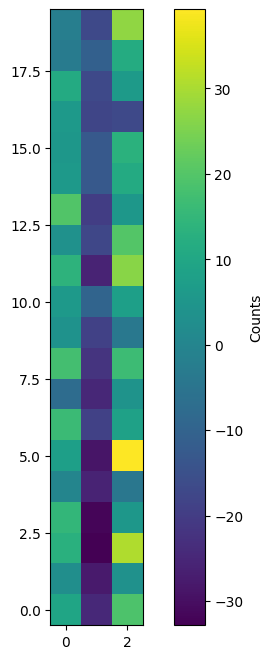

In [57]:
plt.figure('BadPixels Zoom', figsize=(8, 8))
testImage = RImages_bf_bg[1][1200:1220, 1256:1259]
plt.imshow(testImage, origin='lower')
plt.colorbar(label='Counts')
plt.show()

### Correcting This Line (Manually)

In [58]:
data = RImages_bf_bg[1]
for y in range(y1, y2):
    data[y, x1:(x2 + 1)] = interpol(data[y, x1 - 1], data[y, x2 + 1], x2 - x1 + 1)

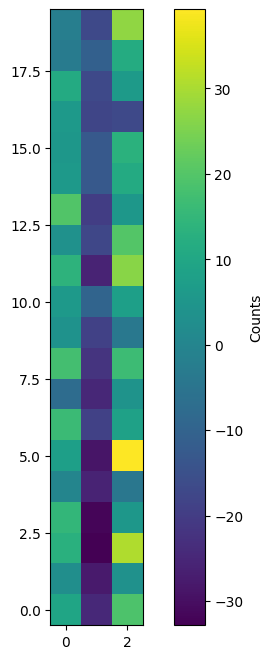

In [59]:
plt.figure('BadPixels Fixed', figsize=(8, 8))
plt.imshow(data[1200:1220, 1256:1259], origin='lower')
plt.colorbar(label='Counts')
plt.show()

We know that the correction worked because the previously visible bad pixels, which appeared as a bright line or block, are no longer distinguishable. The affected region now blends smoothly with the surrounding pixels, showing no abrupt changes or discontinuities, so we generalize it.

## General Function for Automatic Bad Pixel Fixing

We automate the interpolation process because bad pixels often appear in many places, and correcting them manually is slow and impractical.
 
The interpolation is applied differently depending on the shape of the defective area:
- If the bad region is horizontal (a line or block), we interpolate vertically using the values from the pixels above and below.
- If the bad region is vertical, we interpolate horizontally using the values from the pixels to the left and right.

In [60]:
def fixLines(data, badPix):
    for i in range(len(badPix)):
        x1 = badPix.loc[i, 'x1'] - 1
        x2 = badPix.loc[i, 'x2'] - 1
        y1 = badPix.loc[i, 'y1'] - 1
        y2 = badPix.loc[i, 'y2'] - 1

        if (x2 - x1) >= (y2 - y1):  # Horizontal line
            for x in range(x1, x2):
                data[y1:(y2 + 1), x] = interpol(data[y1 - 1, x], data[y2 + 1, x], y2 - y1 + 1)

        else:  # Vertical line
            for y in range(y1, y2):
                data[y, x1:(x2 + 1)] = interpol(data[y, x1 - 1], data[y, x2 + 1], x2 - x1 + 1)

### Visual Check Before Fixing

In [61]:
data = RImages_bf_bg[1]
stats = imstats(data[500:-500, 500:-500])

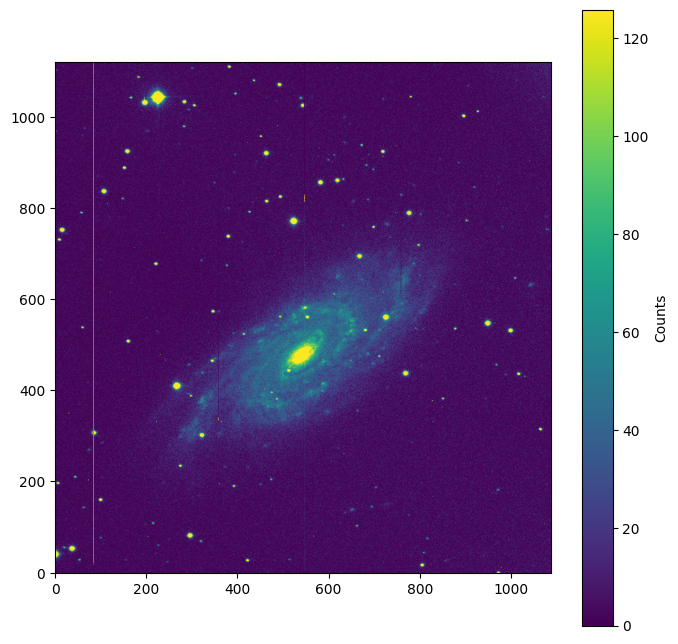

In [62]:
plt.figure('Before Bad Pixels Removal', figsize=(8, 8))
plt.imshow(data[500:-500, 500:-500], vmin=0, vmax=stats['mean'] + 0.35 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

It works nice, so we can apply for the rest.

### Apply the Fixing Function

In [63]:
fixLines(RImages_bf_bg[1], badPix)
data = RImages_bf_bg[1]
stats = imstats(data[500:-500, 500:-500])

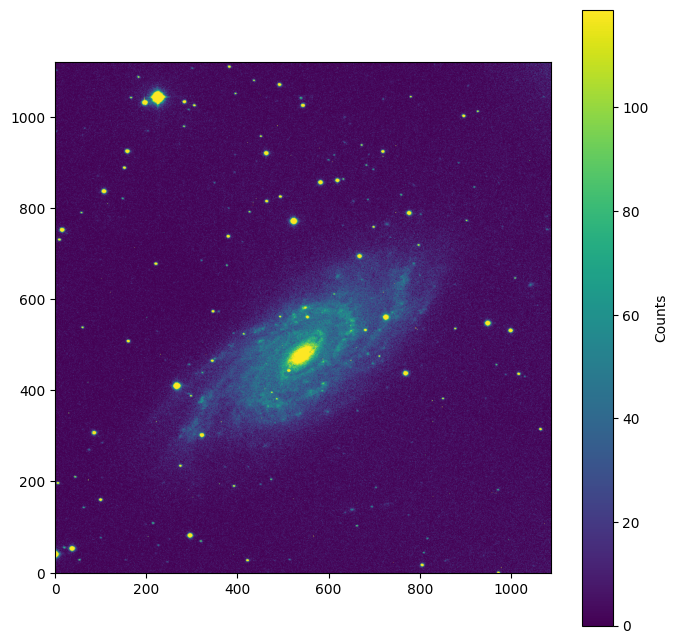

In [64]:
plt.figure('After Bad Pixels Removal', figsize=(8, 8))
plt.imshow(data[500:-500, 500:-500], vmin=0, vmax=stats['mean'] + 0.35 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

We can't see any anoying line and that's perfect so let's do it for each image

### Apply to All Images

In [65]:
for image in HaImages_bf_bg:
    fixLines(image, badPix)

In [66]:
for image in RImages_bf_bg:
    fixLines(image, badPix)

# Time Normalization

In astrophotography, images are often taken with varying exposure times, meaning that the total recorded flux (the number of detected photons) in an image depends on how long the camera was exposed to the light source. To compare images taken with different exposure times or to combine them in a meaningful way, we must normalize the pixel values by dividing them by the exposure time. This process ensures that all images are scaled to a common unit: counts per second.

In this case, the exposure time is stored in the header of each FITS file under the keyword `'EXPTIME'`. The normalization is applied to both R-band and Hα-band images as follows:

In [67]:
R_norm = [RImages_bf_bg[i] / fits.open(galaxyR[i])[0].header['EXPTIME'] for i in range(len(galaxyR))]
Ha_norm = [HaImages_bf_bg[i] / fits.open(galaxyHa[i])[0].header['EXPTIME'] for i in range(len(galaxyHa))]

Here a test visualization in order to check if the normalization worked correctly:

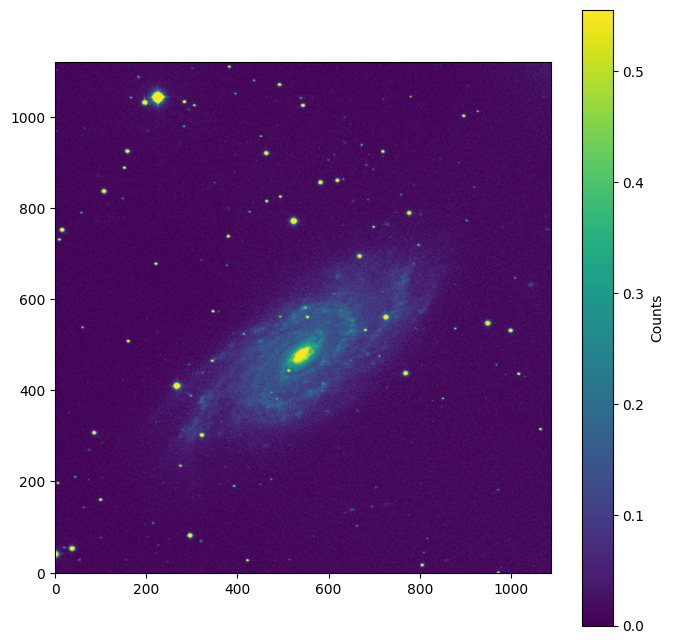

In [68]:
data = R_norm[1]
stats = imstats(data[500:-500, 500:-500])
plt.figure('Normalized R', figsize=(8, 8))
plt.imshow(data[500:-500, 500:-500], vmin=0, vmax=stats['mean'] + 0.5 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

# SuperHa & SuperR

After normalizing all images by their exposure time, the next step is to combine them to generate **superHa** and **superR**, which are representative master images for each band. This process reduces noise and minimizes artifacts from individual exposures. Finally, we save the images.

In [69]:
superHa = np.nanmedian(Ha_norm, axis=0)
superR = np.nanmedian(R_norm, axis=0)

/home/angel/ProyectosAstronomia/envAstro1/lib/python3.12/site-packages/numpy/_core/_methods.py:52: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/tmp/ipykernel_7947/3174767108.py:1: RuntimeWarning: All-NaN slice encountered
  superHa = np.nanmedian(Ha_norm, axis=0)
/tmp/ipykernel_7947/3174767108.py:2: RuntimeWarning: All-NaN slice encountered
  superR = np.nanmedian(R_norm, axis=0)


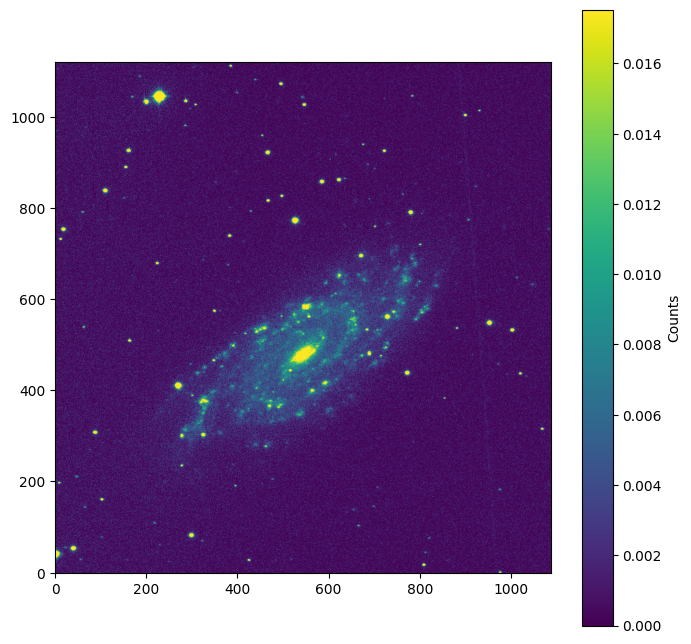

In [70]:
# Calculamos las estadísticas de superHa
stats_superHa = imstats(superHa[500:-500, 500:-500])

plt.figure('Super Ha Image', figsize=(8, 8))
plt.imshow(superHa[500:-500, 500:-500], vmin=0, vmax=stats_superHa['mean'] + 0.5 * stats_superHa['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

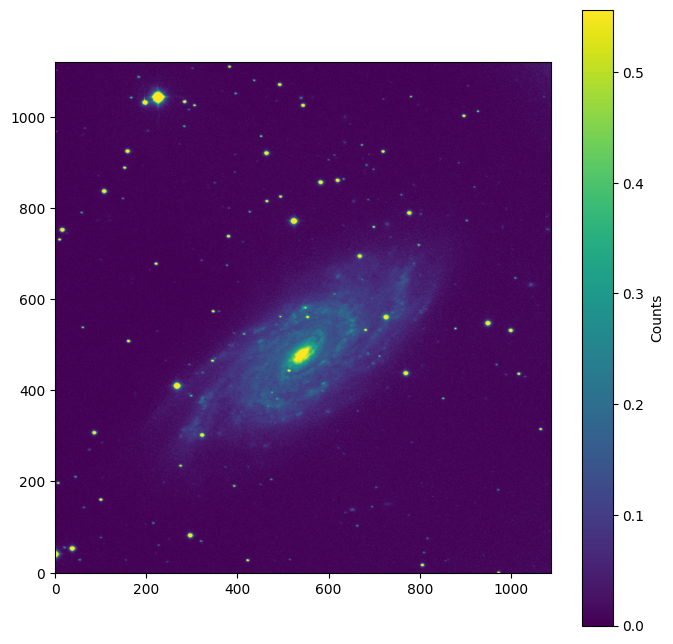

In [71]:
# Calculamos las estadísticas de superR
stats_superR = imstats(superR[500:-500, 500:-500])

plt.figure('Super R Image', figsize=(8, 8))
plt.imshow(superR[500:-500, 500:-500], vmin=0, vmax=stats_superR['mean'] + 0.5 * stats_superR['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

In [72]:
hdu = fits.PrimaryHDU(superHa.astype(np.float32))
hdu.writeto('superHa.fits', overwrite=True)

In [73]:
hdu = fits.PrimaryHDU(superR.astype(np.float32))
hdu.writeto('superR.fits', overwrite=True)

# Detection, Photometry, and Flux Calibration of Stars in Hα and R Bands

To detect sources of **Hα emission**, we must distinguish true Hα-emitting objects from stars that also contribute flux in this band simply due to their broad spectral emission. Since these stars radiate across multiple nearby wavelengths, we use R-band images to estimate and subtract their contribution from the Hα measurements.  

We perform star detection directly in the **Hα image**, as stars appear fainter in this narrowband filter, making their identification more challenging. The R-band, being much broader, captures significantly more flux, which can lead to false detections from background variations, bright star-forming regions, or non-stellar structures. Identifying stars in Hα ensures that we select genuine sources emitting in this spectral line, minimizing contamination.  

## Stars Detection

To detect stars, we use the [`DAOStarFinder`](https://photutils.readthedocs.io/en/2.0.2/api/photutils.detection.DAOStarFinder.html#daostarfinder) algorithm from [`photutils`](https://photutils.readthedocs.io/en/2.0.2/index.html#photutils), which applies a Gaussian convolution kernel to enhance point-like sources and distinguish them from noise. The image is preprocessed by subtracting the background median, and a detection threshold is set based on the standard deviation of the background. A circular kernel helps in detecting stellar-like objects, while a mask excludes the galaxy region to prevent contamination from diffuse emission.  

Using the detected Hα sources, we extract their positions and measure flux in both bands. Comparing the fluxes of these stars in Hα and R allows us to estimate the excess brightness in R due to its broader spectral coverage. This correction is applied through a **simple linear fit**, ensuring that the final Hα flux values accurately reflect only true Hα emission.

In [74]:
data = superHa[500:-500, 500:-500]
mean, median, std = sigma_clipped_stats(data, sigma=3.0)

In [75]:
daofind = DAOStarFinder(fwhm=3.0, threshold=10.*std)
sources = daofind(data - median)
for col in sources.colnames:
    sources[col].info.format = '%.8g' 
print(sources)

 id xcentroid ycentroid sharpness  ...    flux        mag     daofind_mag 
--- --------- --------- ---------- ... ---------- ----------- ------------
  1 974.01534 1.3321204 0.52963028 ...  0.3665079   1.0897917  -0.46696159
  2 807.02359 17.814303 0.45575255 ... 0.90873802  0.10390326   -1.1757289
  3 424.16738 28.022162 0.55262695 ... 0.46347477  0.83493476  -0.49705209
  4 1.1806417 41.634174 0.36538557 ...  23.307412  -3.4187351    -4.828057
  5 39.750994 54.015111 0.49883126 ...  5.2933621   -1.809329   -2.6163403
  6 298.08807 82.655034  0.4762375 ...  4.4973894  -1.6324012   -2.6827472
  7 102.27231 161.14284 0.44048502 ... 0.73064334  0.34073642  -0.74657483
  8 277.12501 235.37947  0.4139486 ... 0.41159902  0.96381418 -0.060884574
  9 324.16903 302.84611 0.46689586 ...  2.7045339  -1.0802311   -2.2326749
 10 87.743255 307.98235 0.45006897 ...  2.2168094  -0.8643209   -1.9294568
...       ...       ...        ... ...        ...         ...          ...
 40 465.11237 921.50831 0

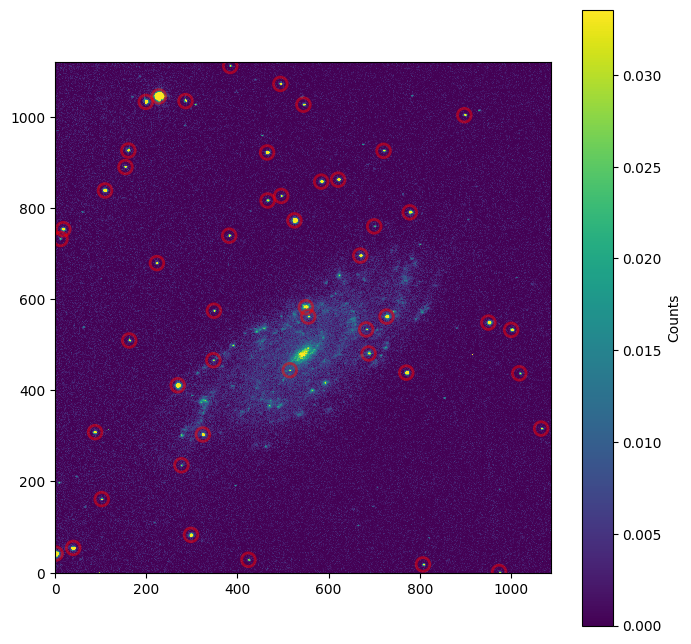

In [76]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=15.0)
stats = imstats(data)
plt.figure('Stars located', figsize=(8, 8))
plt.imshow(data, vmin=0, vmax=stats['median']+ stats['std'],origin='lower', interpolation='nearest')
plt.colorbar(label='Counts')
apertures.plot(color='red', lw=2, alpha=0.5)
plt.show()

In [77]:
mask = np.zeros(data.shape, dtype=bool)
mask[210:700, 220:780] = True
sources = daofind(data - median, mask=mask)
for col in sources.colnames:
    sources[col].info.format = '%.8g'
print(sources)

 id xcentroid ycentroid sharpness  ...    flux        mag     daofind_mag
--- --------- --------- ---------- ... ---------- ----------- -----------
  1 974.01534 1.3321204 0.52963028 ...  0.3665079   1.0897917 -0.46696159
  2 807.02359 17.814303 0.45575255 ... 0.90873802  0.10390326  -1.1757289
  3 424.16738 28.022162 0.55262695 ... 0.46347477  0.83493476 -0.49705209
  4 1.1806417 41.634174 0.36538557 ...  23.307412  -3.4187351   -4.828057
  5 39.750994 54.015111 0.49883126 ...  5.2933621   -1.809329  -2.6163403
  6 298.08807 82.655034  0.4762375 ...  4.4973894  -1.6324012  -2.6827472
  7 102.27231 161.14284 0.44048502 ... 0.73064334  0.34073642 -0.74657483
  8 87.743255 307.98235 0.45006897 ...  2.2168094  -0.8643209  -1.9294568
  9 1066.1388 315.78368 0.57632824 ...  0.5831387  0.58557034 -0.59664944
 10  1018.295 437.05571 0.42380777 ... 0.69562803  0.39405732 -0.82082351
...       ...       ...        ... ...        ...         ...         ...
 26 465.11237 921.50831 0.44124743 ...

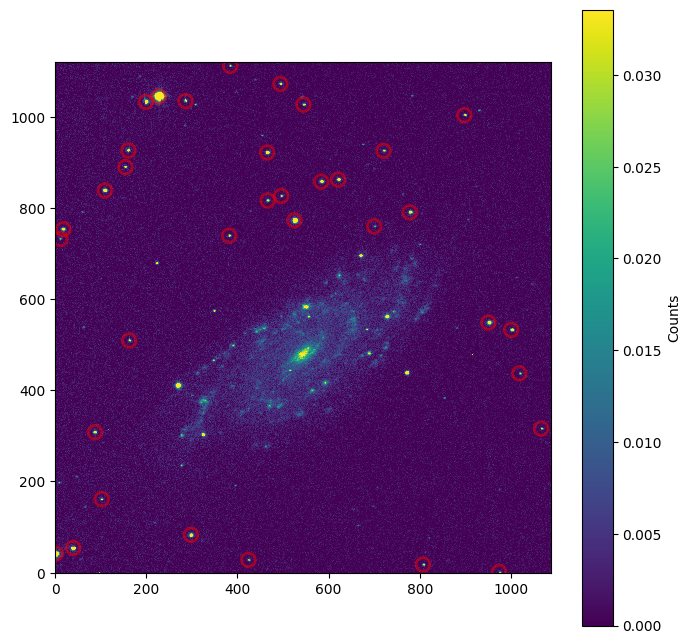

In [78]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=15.0)
stats = imstats(data)
plt.figure('Stars located', figsize=(8, 8))
plt.imshow(data, vmin=0, vmax=stats['median']+stats['std'],origin='lower', interpolation='nearest')
plt.colorbar(label='Counts')
apertures.plot(color='red', lw=2, alpha=0.5)
plt.show()

In [79]:
xs = sources['xcentroid']
ys = sources['ycentroid']
data = superR[500:-500, 500:-500]
xR, yR = centroid_sources(data, xs, ys)
data = superHa[500:-500, 500:-500]
xHa, yHa = centroid_sources(data, xs, ys)

In [80]:
positionsR = np.transpose([xR, yR])
apertureR = CircularAperture(positionsR, r=15.0)
positionsHa = np.transpose([xHa, yHa])
apertureHa = CircularAperture(positionsHa, r=15.0)

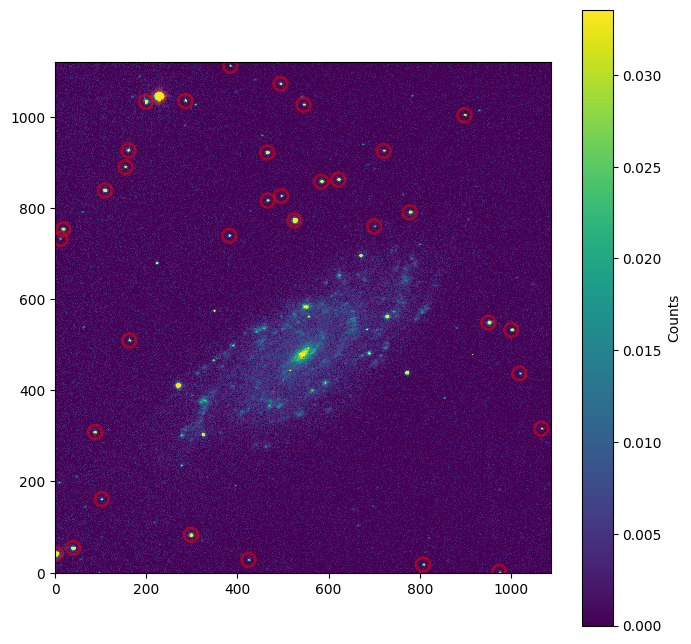

In [81]:
plt.figure('Where the stars are', figsize=(8,8))
data = superHa[500:-500, 500:-500]
stats = imstats(data)
plt.imshow(data, vmin=0, vmax=stats['median']+stats['std'],origin='lower', interpolation='nearest')
plt.colorbar(label='Counts')
apertureHa.plot(color='red', lw=2, alpha=0.5)
plt.show()

## Aperture Photometry

Once the stars have been detected, the next step is to measure their flux using aperture photometry. This method consists of summing the pixel values within a defined circular region centered on each detected source. The choice of aperture size is crucial, as it must be large enough to include most of the star's light but small enough to minimize contamination from the background or nearby sources. The raw flux values obtained from this process are referred to as [`aperture_sum`](https://photutils.readthedocs.io/en/2.0.2/api/photutils.aperture.ApertureStats.html#photutils.aperture.ApertureStats.sum), which represents the total light detected within the aperture. The measured fluxes in both the Hα and R bands allow us to compare the relative brightness of sources across different wavelengths.

In [82]:
phot_tableR = aperture_photometry(superR[500:-500, 500:-500], apertureR)
phot_tableR['aperture_sum'].info.format ='%.8g' 
print(phot_tableR)

 id      xcenter            ycenter       aperture_sum
--- ------------------ ------------------ ------------
  1  971.3223710808609 1.2501143967866488    19.431698
  2  804.3142137078756 17.210041693723397    51.451915
  3 421.81456892915077  27.45907162171263    22.748341
  4 1.0073438107089705  41.10133267863425    526.10503
  5  37.77179853172847  53.43502543065424    310.55368
  6   295.836363626902  82.08680648346198    237.02788
  7 100.12887385612494 160.45581981057583    35.252719
  8  85.88855761484864  307.1769524515962    109.59898
  9 1063.2050498400101 315.00415939626834    26.700949
 10 1015.4258476923525  436.2625132117799    40.726949
...                ...                ...          ...
 26 462.71614449204253  919.9819037795726    201.38817
 27  718.1787759707861  923.5761096312278    53.701585
 28 158.75975658967795  924.2460635450077    141.05085
 29  895.1873237248858 1001.5866186877672     46.67324
 30  542.8940268168341 1024.6373330936017    89.324012
 31 196.95

In [83]:
phot_tableHa = aperture_photometry(superHa[500:-500, 500:-500], apertureHa)
phot_tableHa['aperture_sum'].info.format = '%.8g' 
print(phot_tableHa)

 id      xcenter            ycenter       aperture_sum
--- ------------------ ------------------ ------------
  1   973.967026189943  1.688090704285356    0.5312443
  2  807.0467431005613   17.6783015623791     1.253501
  3  424.2445230520703 28.132029150391755   0.75530911
  4 1.8000814850412956  41.63083995380978    33.517346
  5 39.790045207644766  53.97321464895424    9.0364992
  6 298.15361286623585  82.65923556040607    7.1807198
  7 102.20329314826157  161.1103535758243    1.4132206
  8  87.69004649983636  308.0056027770605    3.7904787
  9 1066.2689769154458  315.6653896755733   0.87308743
 10 1018.3660841516935  437.0153244449919    1.0486958
...                ...                ...          ...
 26  465.1612898101527  921.4821036706815    5.6591499
 27  720.5894460698565  925.0413251142509    1.5840858
 28   160.811967436769  925.8588950202409    4.0746456
 29  897.7777359816557 1003.2543020222056    1.3658594
 30  545.1765638136326 1026.2661761814943    2.0403627
 31  199.1

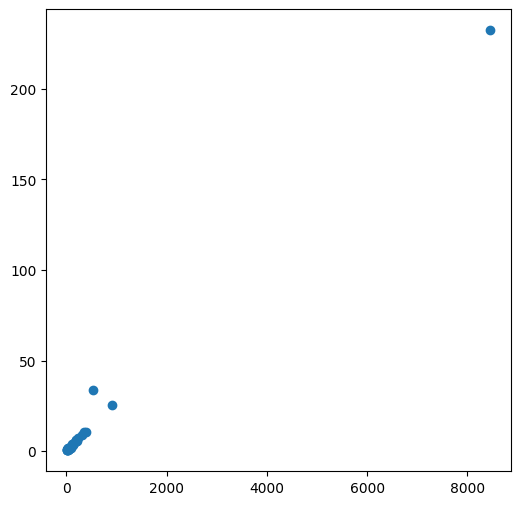

In [84]:
fluxesR = np.array(phot_tableR['aperture_sum'])
fluxesHa = np.array(phot_tableHa['aperture_sum'])

plt.figure('Fluxes in R vs in Ha', figsize=(6, 6))
plt.plot(fluxesR, fluxesHa, marker='o', linewidth=0)
plt.show()

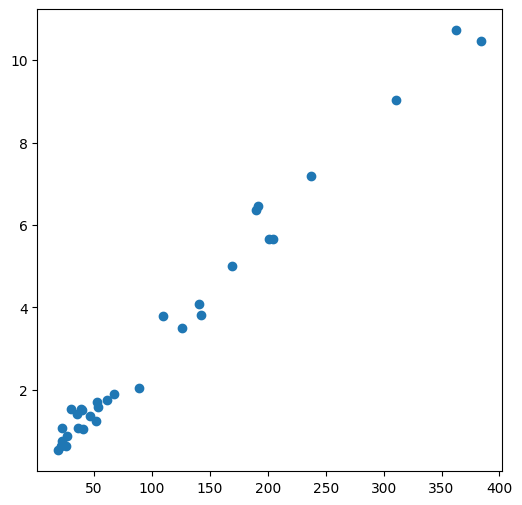

In [85]:
fluxesR = np.array(phot_tableR['aperture_sum']) 
fluxesHa = np.array(phot_tableHa['aperture_sum'])

fluxesR = np.delete(fluxesR, [32,17,3]) #We get rid of the weird data.
fluxesHa = np.delete(fluxesHa, [32,17,3])

plt.figure('Fluxes in R vs in Ha', figsize=(6, 6))
plt.plot(fluxesR, fluxesHa, marker='o', linewidth=0)
plt.show()

I'm going to use a better format in order to represent this plot. It is generated using [`matplotlib.pyplot.subplots`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) to create a flexible figure and axis environment. The data points are plotted with [`ax.scatter`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.scatter.html), while the fitted regression line is added using [`ax.plot`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.plot.html).

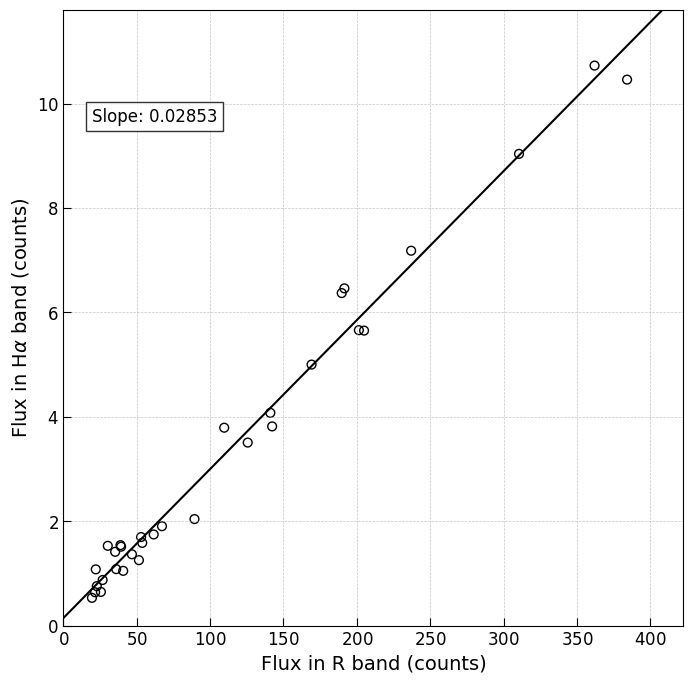

In [86]:
m, n = np.polyfit(fluxesR, fluxesHa, 1)

fig, ax = plt.subplots(figsize=(8, 8))

ax.scatter(fluxesR, fluxesHa, facecolors='none', edgecolors='black', s=40) 
x_fit = np.linspace(0, max(fluxesR)*1.1, 100)
ax.plot(x_fit, n + m * x_fit, linestyle='-', color='black', linewidth=1.5)

ax.set_xlabel(r'Flux in R band (counts)', fontsize=14)
ax.set_ylabel(r'Flux in H$\alpha$ band (counts)', fontsize=14)
ax.set_xlim(0, max(fluxesR)*1.1)
ax.set_ylim(0, max(fluxesHa)*1.1)

ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))

ax.grid(which='both', linestyle='--', linewidth=0.5, alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=12, direction='in', length=6)
ax.tick_params(axis='both', which='minor', labelsize=10, direction='in', length=3)
ax.text(0.05 * max(fluxesR), 0.9 * max(fluxesHa), f"Slope: {m:.5f}", fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.show()

We save m.

# HII Regions

## superGalaxy

To accurately detect HII regions, we must first create a processed image where the excess flux from other sources—mainly stars—is properly subtracted. Since stars emit across a broad range of wavelengths, including Hα, we use the R-band image as a reference to estimate and remove their contribution. By applying a linear fit between the fluxes in the Hα and R bands, we can model and subtract the stellar continuum emission, isolating the true Hα emission. This ensures that the final image highlights only regions with significant ionized hydrogen, making the detection of HII regions more reliable.

In [87]:
superGalaxy = superHa - m*superR

/tmp/ipykernel_7947/345088612.py:1: RuntimeWarning: invalid value encountered in subtract
  superGalaxy = superHa - m*superR


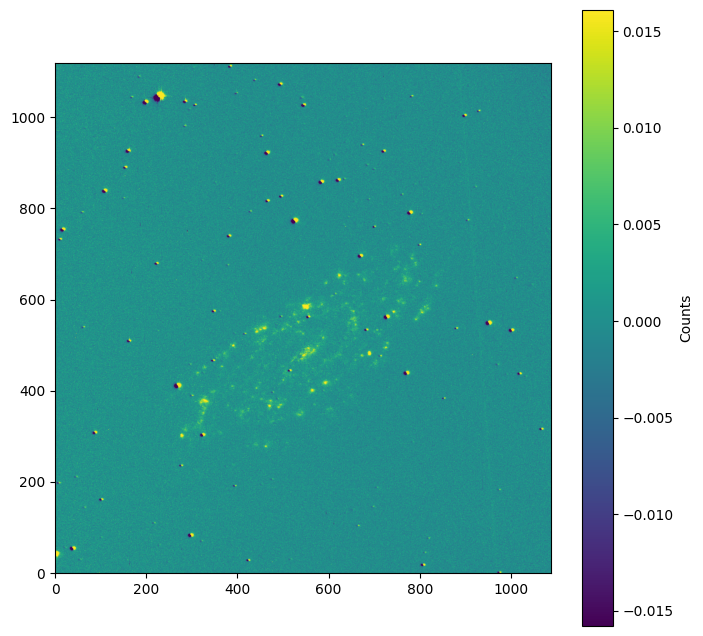

In [88]:
plt.figure('SuperGalaxy', figsize=(8,8))
data = superGalaxy[500:-500, 500:-500]
stats = imstats(data)
plt.imshow(data, vmin=stats['median']-0.5*stats['std'], vmax=stats['median']+0.5*stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

The final super image shows dark spots, likely caused by misalignment between the Hα and R-band images, leading to incorrect subtraction and residual negative flux. Another possible issue is the presence of NaN or infinite values propagating through the operation. Differences in point spread functions (PSF) between bands may also contribute, especially around bright sources. Additionally, an improper scaling factor for the R-band subtraction could introduce discrepancies. In any case we will save the image:

In [89]:
hdu = fits.PrimaryHDU(superGalaxy.astype(np.float32))
hdu.writeto('superGalaxy.fits', overwrite=True)

## Rotation of the Galaxy

To analyze the structure of the galaxy, it is convenient to align its major axis with the x-axis. The galaxy is not necessarily oriented in this way in the original image, so we need to determine its orientation and apply a rotation. To achieve this, we first compute the geometric properties of the image, identifying the centroid and orientation of the galaxy. The orientation is extracted from the elliptical fit to the galaxy's light distribution, providing an angle that represents how tilted the galaxy is with respect to the horizontal axis. Once this angle is obtained, we rotate the image accordingly, ensuring that the galaxy appears face-on in our reference frame. This step simplifies further analysis and allows for better visualization of its morphology.

In [90]:
galaxyProperties = data_properties(superGalaxy[600:-600, 600:-600])
columns = ['label', 'xcentroid', 'ycentroid', 'ellipticity', 'orientation']
galaxyTable = galaxyProperties.to_table(columns=columns)

rotationAngle = np.array(galaxyTable['orientation'])
print(rotationAngle)

[41.76393779]


When computing the orientation of the galaxy, we obtain an angle that represents its inclination with respect to the x-axis. This angle is derived from the elliptical fit of the galaxy's light distribution. However, small uncertainties in the fitting process or asymmetries in the galaxy’s shape can lead to slight inaccuracies in the computed angle. Because of this, applying the rotation directly may not always result in a perfectly aligned image. Instead of relying strictly on this computed value, we decide to refine the alignment manually, ensuring that the galaxy is optimally oriented for subsequent analysis. This approach balances computational precision with visual inspection to achieve a more reliable transformation.

In [91]:
rotatedGalaxy = rotate(superGalaxy, angle=rotationAngle[0]-8, prefilter=False)

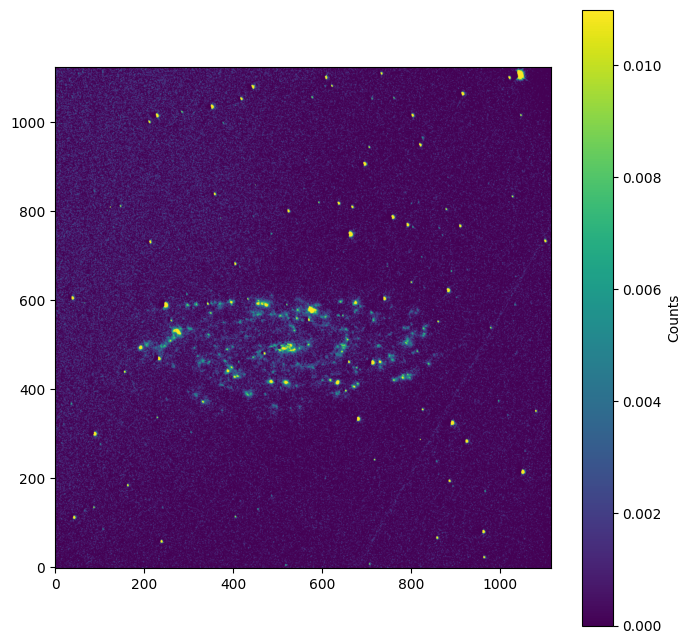

In [92]:
plt.figure('SuperImage Rotated', figsize=(8,8))
croppedGalaxyData = rotatedGalaxy[900:-900, 900:-900]
stats = imstats(croppedGalaxyData)
plt.imshow(croppedGalaxyData, vmin=0, vmax=stats['median'] + 0.5 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

## Resizing the image

After rotating the galaxy, we need to ensure that our field of view is well-centered and that any unwanted artifacts introduced by the rotation are removed. The rotation process expands the image, filling empty regions with background values, so we apply a controlled cropping to isolate the relevant area. The cropping parameters are chosen to retain the galaxy while discarding the edges where interpolation effects or padding may introduce inaccuracies. This step ensures that the processed image remains well-defined and optimized for further analysis, preserving only the essential astrophysical information.  

Additionally, we perform a sigma clipping to refine the measurement of the galaxy’s ellipticity, as the previous value may be inconsistent due to noise or background fluctuations. This allows us to determine the correct extent of the stretching required to properly adjust the image, ensuring that the shape of the galaxy is accurately represented.

/home/angel/ProyectosAstronomia/envAstro1/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


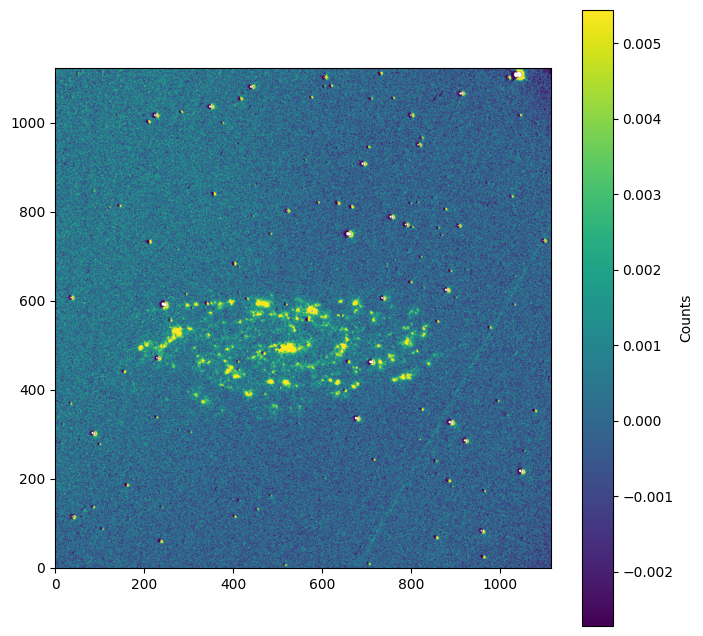

In [115]:
# Apply sigma clipping correctly
sigClip = SigmaClip(sigma=12.0)
croppedImage = sigClip(rotatedGalaxy[900:-900, 900:-900])

# Correct NaN or Inf values that may remain after rotation and sigma clipping
croppedImage = np.nan_to_num(cleanedImage)

# Apply fixed cropping
#croppedImage = cleanedImage[900:-900, 900:-900]

# Compute statistics for better visualization
stats = imstats(croppedImage)

# Display the corrected image
plt.figure('Sigma Clipped Image', figsize=(8, 8))
plt.imshow(croppedImage[900:-900, 900:-900], vmin=stats['median'] -  stats['std'], 
           vmax=stats['median'] + 2 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

The white spots in the image correspond to regions that have been clipped during the sigma-clipping process. These areas, primarily stars, have flux values significantly deviating from the local background and are thus removed to reduce contamination in subsequent measurements. By applying this clipping, we aim to refine the calculation of the galaxy's ellipticity using the `data_properties` function, ensuring that the measurement is not biased by bright foreground sources or noise. This step enhances the accuracy of the shape estimation, which is crucial for properly stretching and aligning the galaxy in the final image.

In [108]:
galaxyProperties = data_properties(croppedImage[300:670, 50:850])
columns = ['label', 'xcentroid', 'ycentroid', 'ellipticity', 'orientation']
galaxyTable = galaxyProperties.to_table(columns=columns)
print(galaxyTable)

label     xcentroid     ...    ellipticity         orientation    
                        ...                            deg        
----- ----------------- ... ------------------ -------------------
    1 757.9805452261832 ... 0.5091252179201131 -24.125543772307505


In [109]:
aspectRatio = 1 - galaxyTable['ellipticity'].value  # b/a ratio
stretchedGalaxy = zoom(rotatedGalaxy, zoom=(1/aspectRatio[0], 1), prefilter=False)

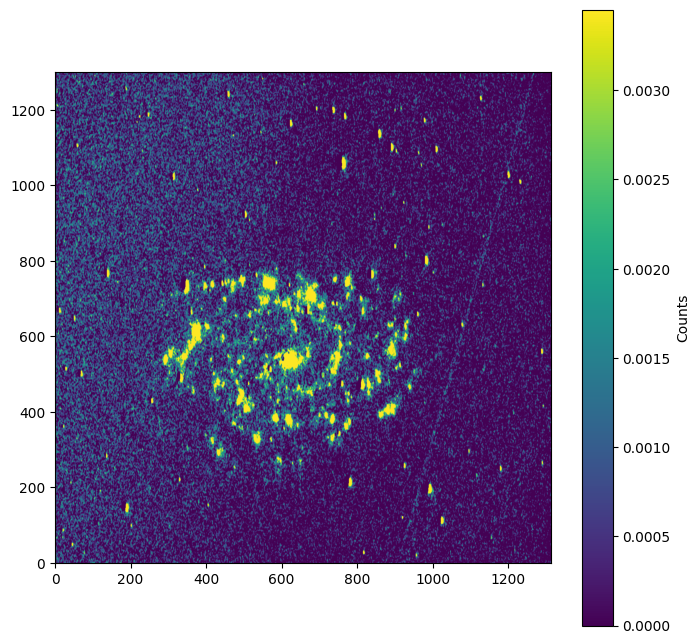

In [110]:
plt.figure('Test Zoom', figsize=(8,8))
croppedGalaxyData = stretchedGalaxy[2300:3600, 800:-800]
stats = imstats(croppedGalaxyData)
plt.imshow(croppedGalaxyData, vmin=0, vmax=stats['median'] + 0.5 * stats['std'], origin='lower')
plt.colorbar(label='Counts')
plt.show()

## Identifying HII Re

Finally, we can proceed to identify the HII regions, which correspond to areas of intense H-alpha emission where stellar formation is actively occurring. To achieve this, we once again utilize `DAOStarFinder`, but with a significantly increased `fwhm` parameter. Unlike previous detections of point-like sources such as stars, this time we are searching for more extended emission regions. An alternative approach would be to use the `find_peaks` function from `photutils.detection`, which is well-suited for identifying bright sources. However, `find_peaks` only provides the peak intensity of each region rather than the total emitted flux, which is a crucial parameter for our subsequent analysis.

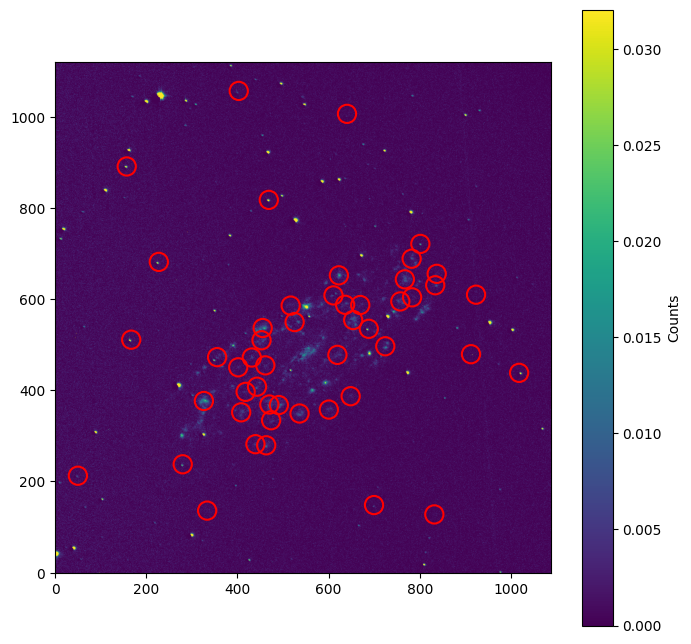

In [123]:
mean, median, std = sigma_clipped_stats(data, sigma=2.0)
daofind = DAOStarFinder(fwhm=25.0, threshold=5.*std)
HIIregions = daofind(data)
positions = np.transpose((HIIregions['xcentroid'], HIIregions['ycentroid']))
apertures = CircularAperture(positions, r=20)
plt.figure('Visualization of Halpha peaks', figsize=(8, 8))
stats = imstats(data)
plt.imshow(data, vmin=0, vmax=stats['median']+stats['std'], origin='lower')
plt.colorbar(label='Counts')
apertures.plot(color='red', lw=1.5)
plt.show()

Four of the detected sources are actually stars located outside the galaxy. Since they are not part of the HII regions we aim to analyze, we will manually remove them to ensure our results focus solely on the relevant emission regions.

In [125]:
index = [i for i, row in enumerate(HIIregions) 
                      if row['xcentroid'] > 900 or row['ycentroid'] > 900]
HIIregions.remove_rows(index)

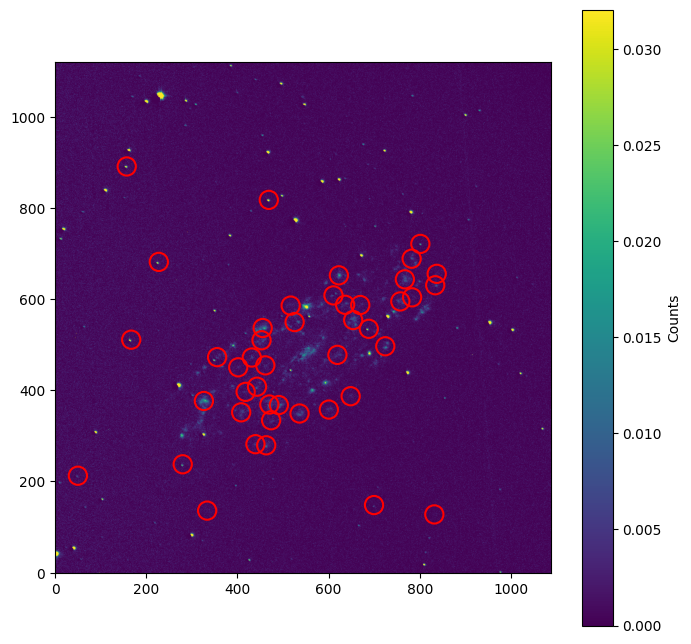

In [126]:
positions = np.transpose((HIIregions['xcentroid'], HIIregions['ycentroid']))
apertures = CircularAperture(positions, r=20)
plt.figure('Visualization of Halpha peaks', figsize=(8, 8))
stats = imstats(data)
plt.imshow(data, vmin=0, vmax=stats['median']+stats['std'], origin='lower')
plt.colorbar(label='Counts')
apertures.plot(color='red', lw=1.5)
plt.show()

## 2D Bubble Chart

A clear way to represent the detected HII regions is through a **bubble chart**, where each region is plotted based on its centroid position, and its size is proportional to the measured flux. The color scale represents the intensity of the peak emission. This visualization provides an intuitive way to assess the distribution and relative brightness of the regions within the galaxy. The chart is created using [`matplotlib.pyplot.scatter`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html), which allows us to set the marker size proportional to the flux and color-code the points based on peak intensity.

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
x = np.array(positions)[:, 0]
y = np.array(positions)[:, 1]
peaks = np.array(HIIregions['peak']) * 1e4
fluxes = np.array(HIIregions['flux']) * 100

norm = colors.LogNorm(vmin=peaks.min(), vmax=peaks.max())
scatter = ax.scatter(x, y, s=fluxes, c=peaks, norm=norm, alpha=0.8, edgecolors='black', linewidth=0.5)

ax.set_xlabel("X Position (px)", fontsize=14)
ax.set_ylabel("Y Position (px)", fontsize=14)
ax.set_title("HII Regions Detected", fontsize=16, fontweight='bold')

kw = dict(prop="sizes", num=5, color='black', fmt="{x:.2f}", func=lambda s: s / 100)
legend2 = ax.legend(*scatter.legend_elements(**kw), loc="lower right", title="Flux (counts)")

ax.add_artist(legend2)
ax.set_aspect('equal')
plt.grid(visible=True, linestyle="--", linewidth=0.5, alpha=0.7)
plt.show()

## 3D Interactive Bubble Chart

To improve the analysis of the 3D representation, we create an **interactive 3D bubble chart** using [`plotly.graph_objects.Scatter3d`](https://plotly.com/python/3d-scatter-plots/). This allows us to observe the distribution from different perspectives, making it easier to identify structures and spatial relationships within the galaxy. The interactive visualization provides a smooth and continuous way to explore the data by adjusting the camera position dynamically.

In [ ]:
# Generate data
x = np.random.uniform(300, 900, 50)
y = np.random.uniform(300, 900, 50)
z = np.zeros_like(x)  # Projection in XY

sizes = np.random.uniform(5, 50, len(x))
colors = np.random.uniform(0, 1, len(x))

# Create the 3D figure
fig = go.Figure(data=[go.Scatter3d(
    x=x, y=y, z=z,
    mode='markers',
    marker=dict(
        size=sizes,
        color=colors,
        colorscale='viridis',
        opacity=0.8
    )
)])

# Adjust layout with automatic rotation
fig.update_layout(
    scene=dict(
        xaxis_title="X Position (px)",
        yaxis_title="Y Position (px)",
        zaxis_title="Intensity"
    ),
    margin=dict(l=0, r=0, b=0, t=40),
    title="3D Scatter with Rotation"
)

# Camera rotation
fig.update_layout(scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

# Show interactive figure
fig.show()

In [ ]:
fig.write_html("graph.html")

![3D Scatter Plot](plot3d.png)

[Ver gráfico interactivo](graph.html)

# Conclusions

As observed in our analyses, the NGC6118 galaxy exhibits a significant number of HII regions, which are key indicators of active star formation. These regions are predominantly located in the outer parts of the galaxy, especially along the spiral arms, where young massive stars ionize the surrounding hydrogen gas. This pattern is consistent with the idea that star formation is more efficient in the dynamically evolving arms, where gas compression triggers the formation of new stellar populations.

One particularly bright HII region stands out in our diagrams, as evidenced by the higher flux and peak intensity values. This suggests an intense episode of star formation, possibly influenced by local density enhancements or interactions within the galaxy. The presence of such a high-flux region supports a scenario where the galaxy experiences episodic bursts of star formation, likely propagating outward from the center.

The 2D and 3D visualizations provide a clearer perspective of the spatial distribution of these regions. The bubble chart highlights the intensity differences, while the 3D scatter representation allows for a better understanding of the relative positions of the regions within the galactic plane. However, due to the nature of our data, we lack depth information, meaning the third dimension remains a projection rather than an actual spatial representation.

Regarding the rotation of the galaxy, it is important to note that the animated visualization does not accurately depict the physical motion of the galaxy. Galactic rotation follows a differential pattern, where the inner regions rotate more slowly compared to the outer disk, until reaching a near-constant velocity at larger radii. Our representation assumes a uniform rotation, which does not reflect the actual kinematics of a spiral galaxy. Additionally, real galactic rotation curves often exhibit asymmetries, meaning the velocity distribution is not entirely uniform across different azimuthal angles.

Furthermore, without precise kinematic data, we cannot reconstruct the true 3D structure of the galaxy or the exact positions of the HII regions within its disk. Our representation serves primarily as a visualization tool to analyze the morphology and distribution of ionized regions rather than a fully accurate dynamical model.

In conclusion, this analysis provides valuable insight into the star-forming activity of NGC6118, highlighting the distribution and intensity variations of its HII regions. While our visualizations offer a useful approximation, further spectroscopic data would be necessary to refine our understanding of the galaxy’s kinematics and three-dimensional structure.